In [22]:
# Activate environment in current folder
using Pkg
Pkg.activate(pwd())

using Plots, DifferentialEquations, LaTeXStrings, Statistics, Measures, Peaks, DelimitedFiles, Roots, QuadGK, SpecialFunctions, Interpolations, Dates

  Activating project at `~/Desktop/School Stuff/Winter 2024/Research/2024-frequency-memory`


In [23]:
function integrate(f, p, u0, times; cb = nothing, transient = 0, int_method = Euler(), dt = 0.005)
    # Helper function to integrate a system of ode
    
    prob = ODEProblem(f, u0, (times[1], times[end]+transient), p, callback = cb)
    sol = solve(prob, int_method, dt = dt, saveat = times[2]-times[1])
    sol = sol[1:end, 1:end]

    return selectdim(sol, length(size(sol)), size(sol)[end]-length(times)+1:size(sol)[end])
    #return sol
end

function palette_from_hex(hex_list)
    # Function that returns a Julia color palette based on a list of hex codes
    hash_list = [string("#", i) for i in hex_list]
    
    pal = []
    for i in hash_list
        push!(pal, parse(Colorant, i))
    end
    return palette(pal)
end

function cluster_detect(points; max_clusters = 4, thresh = 0.05)
    # Function that takes in a list of complex numbers and figures out how many tight clusters there are

    # iterates over possible cycle lengths and checks if each cycle lengths is of order i
    for i in 1:max_clusters
        sections = points[1:i:end] # list of points with the given cycle as interval

        # check if distance of points from their mean is within treshhold
        mm = mean(sections) # average positions of points
        farthest = maximum(abs.(sections .- mm))    # highest distance between points and their average (a perfect cluster would have this as 0)
        if farthest < thresh
            return i    # if we detect that all the points are close enough to the mean, then we conclude that the system is in this cyclic regime
        end
    end

    return NaN # if we go through all the cycles and none present a cyclic behaviour, then we conclude that they are not entrained
end

# Define color palette with hexcodes
custom_palette = palette_from_hex(["009afa","e36f47","3ea44d","c371d2","ac8e18", "03aaae","ed5e93","c68225","03a98d","8e971d", "03a9cc","9b7fe9","618df6","f06073","dd65b6", "6c9f33","f61067","f7aef8","72ddf7","5e239d", "80ff72","00afb9","685044","fed9b7","f07167"])

# Define color gradient for poincarre maps
time_grad = cgrad([:turquoise, :navyblue], [0.5])

# Default setting for plots
default(
    linewidth = 3, 
    markerstrokewidth = 0,
    palette = palette_from_hex(["009afa","e36f47","3ea44d","c371d2","ac8e18", "03aaae","ed5e93","c68225","03a98d","8e971d", "03a9cc","9b7fe9","618df6","f06073","dd65b6", "6c9f33","f61067","f7aef8","72ddf7","5e239d", "80ff72","00afb9","685044","fed9b7","f07167"])
)


In [24]:
function coupling_atan(x)
    return atan(8*(1-x))/8 + x
end

coupling_atan (generic function with 1 method)

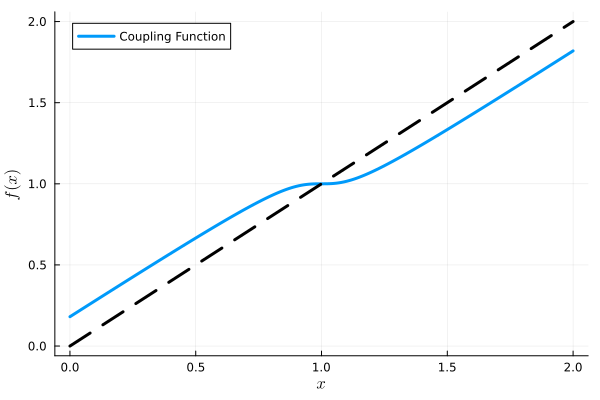

In [25]:
x = 0:0.01:2
plot(coupling_atan, x, xlabel = L"x", ylabel = L"f(x)", label = "Coupling Function")
plot!(x->x, x, label = nothing, linestyle = :dash, color = :black)
plot!()

In [26]:
# Pulsatile Core
function f_pulse_core(du, u, p, t)
    du[1] = 2*π*coupling_atan(u[3]) + p[2]*sin(u[2] - u[1])
    du[2] = 2*π*p[1]
    du[3] = -u[3]*p[3]
end

# Direct core
function f_direct_core(du, u, p, t)
    du[1] = 2*π*coupling_atan(u[3]) + p[2]*sin(u[2] - u[1])
    du[2] = 2*π*p[1]
    du[3] = (du[1]/(2*π)-u[3])*p[3]
end

# Pulsatile Frequency
function f_pulse_frequency(du, u, p, t)
    du[1] = 2*π*coupling_atan(u[3]) 
    du[2] = 2*π*p[1]
    du[3] = -u[3]*p[3] + p[2]*sin(u[2])*u[3]
end

f_pulse_frequency (generic function with 1 method)

## Figure 2

### A)

In [27]:
# TOP PANNEL (DIRECT CORE)
# Parameters
p = [0.9, 0, 1]
u0 = [0, 0.0, 2]

# Times
t_step = 0.0005
final_t = 10
times = 0:t_step:final_t


# Integration
sol = integrate(f_direct_core, p, u0, times, transient = 0/p[1])

# Storing arrays with begining and end of cycles
tt = times
ϕt = sol[1, :]
xt = sol[3, :];
θt = sol[2, :];

# Save data
writedlm("data/fig2_a_top.csv", hcat(tt, cos.(ϕt), xt))

plt1 = plot(tt, cos.(ϕt), label = L"\cos \phi", lc = 1, xaxis = false, ylabel = "Ampliude", legend = false)
plot!(plt1, tt, xt, label = L"x", lc = 3);

In [28]:
# BOTTOM PANNEL (PULSATILE CORE)

# Parameters
p = [0.9, 0, 1]
u0 = [0, 0.0, 2.5]


# Pulse Callback
condition(u,t,integrator) = sin(u[1]/2)
affect!(integrator) = integrator.u[3] += p[3]
cb = ContinuousCallback(condition, affect!, save_positions=(false,false))


# Times
t_step = 0.0005
final_t = 10
times = 0:t_step:final_t


# Integration
sol = integrate(f_pulse_core, p, u0, times, transient = 0/p[1], cb = cb)

# Storing arrays with begining and end of cycles
tt = times
ϕt = sol[1, :]
xt = sol[3, :];
θt = sol[2, :];

# Save data
writedlm("data/fig2_a_bot.csv", hcat(tt, cos.(ϕt), xt))

plt2 = plot(tt, cos.(ϕt), label = L"\cos \phi", lc = 1, xlabel = "Time", ylabel = "Amplitude")
plot!(plt2, tt, xt, label = L"x", lc = 3);

In [29]:
plot(plt1, plt2, layout = (2, 1), xlabel = "Time", ylabel = "Amplitude");

### B)

In [30]:
# TOP PANNEL (COUPLING FUNCTIONS)

# Coupling function with varying parameter
coup_fig2(x, c) = atan(c*(1-x))/c + x

x = 0:0.01:2
plt3 = plot(x, x->x, linestyle = :dash, color = :black, label = nothing, xlabel = L"x", ylabel = L"f(x)") 
for i in 1:1:4
    y = [coup_fig2(j, 2.0^i) for j in x]
    writedlm(string("data/fig2_b_top_", i, ".csv"), [x y])
    plot!(plt3, x, y, palette = :BrBG_6, label = string(L"c=", 2.0^i), lc = i)
end

In [31]:
# BOTTOM PANNEL (EXAMPLE Xs)
plt4 = plot(xlabel = "Time", ylabel = L"x")

for i in 1:4
    
    function f_direct_core_fig2(du, u, p, t)
        du[1] = 2*π*coup_fig2(u[3], 2.0^i) + p[2]*sin(u[1] - u[2])
        du[2] = 2*π*p[1]
        du[3] = (du[1]/(2*π)-u[3])*p[3]
    end

    # Parameters
    p = [0.9, 0, 1]
    u0 = [0, 0.0, 2]

    # Times
    t_step = 0.0005
    final_t = 20
    times = 0:t_step:final_t


    # Integration
    sol = integrate(f_direct_core_fig2, p, u0, times, transient = 0/p[1])

    # Storing arrays with begining and end of cycles
    tt = times
    ϕt = sol[1, :]
    xt = sol[3, :];
    θt = sol[2, :];

    writedlm(string("data/fig2_b_bot_", i, ".csv"), [times xt])

    
    plot!(plt4, tt, xt, palette = :BrBG_6, label = string(L"c=", 2.0^i), lc = i);
end


### Fig

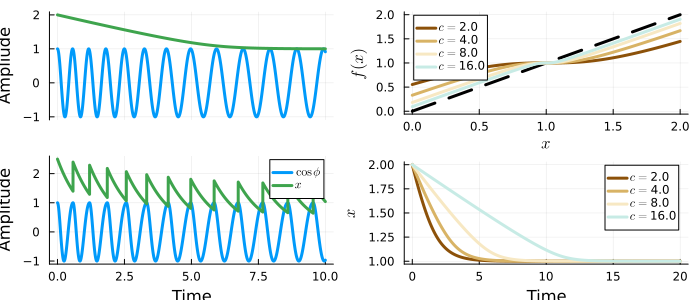

In [32]:
l = @layout [ [a; b] [c ; d]]
plot(plt1, plt2, plt3, plt4, layout = l, size = (700, 300))

## Figure 3

### A)

In [33]:
# USEFUL FUNCTIONS FOR THIS FIGURE
# Time evolution of the k parameter
function k_evolve(t)
    start = 2.5
    finish = 7.5
    if t < start
        return 0
    elseif start <= t < finish
        return 1
    elseif finish <= t
        return 0
    else
        return "ERROR"
    end
end


# Pulsatile Core
function f_pulse_core_fig3_a(du, u, p, t)
    du[1] = 2*π*coupling_atan(u[3]) + p[2]*k_evolve(t)*sin(u[2] - u[1])
    du[2] = 2*π*p[1]
    du[3] = -u[3]*p[3]
end

# Direct core
function f_direct_core_fig3_a(du, u, p, t)
    du[1] = 2*π*coupling_atan(u[3]) + p[2]*k_evolve(t)*sin(u[2] - u[1])
    du[2] = 2*π*p[1]
    du[3] = (du[1]/(2*π)-u[3])*p[3]
end

# Times
t_step = 0.0005
final_t = 10
times = 0:t_step:final_t;

In [34]:
# TOP PANNEL (K TURNED ON AND OFF)
y = [k_evolve(i) for i in times]
writedlm("data/fig3_a_top.csv", [times y])
plt1 = plot(times, y, label = L"k", lc = 5, xlabel = "Time", ylabel = "Amplitude");

In [35]:
# TOP PANNEL (DIRECT CORE)
# Parameters
p = [1.1, 1, 1]
u0 = [π, 0.0, 1]

# Integration
sol = integrate(f_direct_core_fig3_a, p, u0, times, transient = 0/p[1])

# Storing arrays with begining and end of cycles
tt = times
ϕt = sol[1, :]
θt = sol[2, :];
xt = sol[3, :];

writedlm("data/fig3_a_mid.csv", [tt cos.(ϕt) cos.(θt) xt])

plt2 = plot(tt, cos.(ϕt), label = L"\cos \phi", lc = 1, xlabel = "Time", ylabel = "Amplitude")
plot!(plt2, tt, cos.(θt), label = L"\cos \theta", lc = 2);
plot!(plt2, tt, xt, label = L"x", lc = 3);

In [36]:
# TOP PANNEL (PULSATILE CORE)
# Parameters
p = [1.1, 1, 1]
u0 = [π, 0.0, 1.5]

# Pulse Callback
condition(u,t,integrator) = sin(u[1]/2)
affect!(integrator) = integrator.u[3] += p[3]
cb = ContinuousCallback(condition, affect!, save_positions=(false,false))

# Integration
sol = integrate(f_pulse_core_fig3_a, p, u0, times, transient = 0/p[1], cb = cb)

# Storing arrays with begining and end of cycles
tt = times
ϕt = sol[1, :]
xt = sol[3, :];
θt = sol[2, :];

writedlm("data/fig3_a_bot.csv", [tt cos.(ϕt) cos.(θt) xt])

plt3 = plot(tt, cos.(ϕt), label = L"\cos \phi", lc = 1, xlabel = "Time", ylabel = "Amplitude")
plot!(plt3, tt, cos.(θt), label = L"\cos \theta", lc = 2);
plot!(plt3, tt, xt, label = L"x", lc = 3);

### Fig

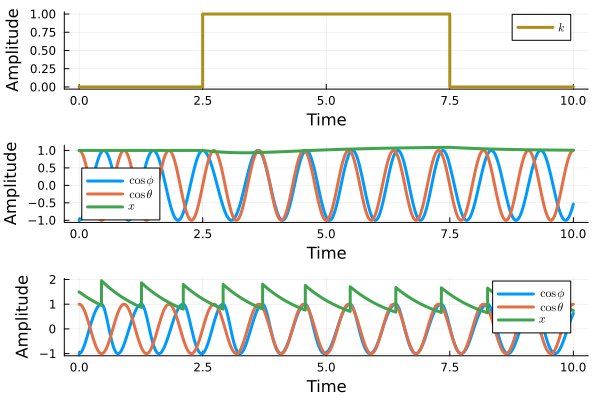

In [37]:
plot(plt1, plt2, plt3, layout = (3, 1))

### B)

In [38]:
# USEFUL FUNCTIONS FOR THE FIGURE

# Ramping the omega frequency
function omega_ramp(t)
    return 1 + t/40*1.5
end

# Non-adaptive
function f_nonadaptive_fig3_b(du, u, p, t)
    du[1] = 2*π + p[2]*sin(u[2] - u[1])
    du[2] = 2*π*omega_ramp(t)
end

# Direct core
function f_direct_core_fig3_b(du, u, p, t)
    du[1] = 2*π*coupling_atan(u[3]) + p[2]*sin(u[2] - u[1])
    du[2] = 2*π*omega_ramp(t)
    du[3] = (du[1]/(2*π)-u[3])*p[3]
end

# Times
t_step = 0.0005
final_t = 15
times = 0:t_step:final_t;

In [39]:
# TOP PANNEL (ω RAMP)
y = [omega_ramp(i) for i in times]
writedlm("data/fig3_b_top.csv", [times y])
plt1 = plot(times, y, label = L"\omega", lc = 5, xlabel = "Time", ylabel = "Amplitude");

In [40]:
# TOP PANNEL (DIRECT CORE)

# Parameters
p = [1.1, 1.5, 5]
u0 = [0, 0.0, 1]

# Integration
sol = integrate(f_direct_core_fig3_b, p, u0, times, transient = 0/p[1])

# Storing arrays with begining and end of cycles
tt = times
ϕt = sol[1, :]
xt = sol[3, :];
θt = sol[2, :];

writedlm("data/fig3_b_mid.csv", [tt cos.(ϕt) cos.(θt)])

plt2 = plot(tt, cos.(ϕt), label = L"\cos \phi", lc = 1, xlabel = "Time", ylabel = "Amplitude")
plot!(plt2, tt, cos.(θt), label = L"\cos \theta", lc = 2);
plot!(plt2, tt, xt, label = L"x", lc = 3);

In [41]:
# TOP PANNEL (Non adaptive)
# Parameters
p = [1.1, 1.5, 10]
u0 = [0, 0.0]

# Integration
sol = integrate(f_nonadaptive_fig3_b, p, u0, times, transient = 0/p[1])

# Storing arrays with begining and end of cycles
tt = times
ϕt = sol[1, :]
θt = sol[2, :];

writedlm("data/fig3_b_bot.csv", [tt cos.(ϕt) cos.(θt)])


plt3 = plot(tt, cos.(ϕt), label = L"\cos \phi", lc = 1, xlabel = "Time", ylabel = "Amplitude")
plot!(plt3, tt, cos.(θt), label = L"\cos \theta", lc = 2);

### Fig

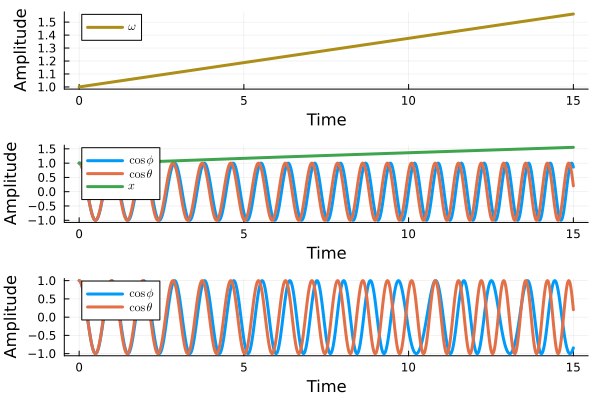

In [42]:
plot(plt1, plt2, plt3, layout = (3, 1))

## Figure 4

### A)

In [43]:
function is_entrained_pulse_core(p, x0; thresh = 0.05)

    u0 = [2*π*rand(), 0, x0]
    # Times
        t_step = 1/p[1]
        final_t = 50/p[1]
        times = 0:t_step:final_t

    # Pulse Callback
        condition(u,t,integrator) = sin(u[1]/2)
        affect!(integrator) = integrator.u[3] += p[3]
        cb = ContinuousCallback(condition, affect!, save_positions=(false,false))

    # Integration
        sol = integrate(f_pulse_core, p, u0, times, transient = 500/p[1], cb = cb)

    # Storing arrays with begining and end of cycles
        tt = times
        ϕt = sol[1, :]
        xt = sol[3, :];
        θt = sol[2, :];
        #println(mod.(ϕt, 2*π))
        
    # Finding the variation of the phases at every pulse
        #var = std(mod.(ϕt, 2*π))
        var = abs(maximum(mod.(ϕt, 2*π)) - minimum(mod.(ϕt, 2*π)))
        #println(var)
        
    if var <= thresh
        return true#, mod(mean(mod.(ϕt, 2*π)) + π, 2*π) - π
    else
        return false#, 0
    end
end

function f_nonadaptive(du, u, p, t)
    du[1] = 2*π + p[2]*sin(u[2] - u[1])
    du[2] = 2*π*p[1]
end

function is_entrained_no_memory(p; thresh = 0.05)

    u0 = [2*π*rand(), 0]

    # Times
        t_step = 1/p[1]
        final_t = 50/p[1]
        times = 0:t_step:final_t

    # Integration
        sol = integrate(f_nonadaptive, p, u0, times, transient = 500/p[1])

    # Storing arrays with begining and end of cycles
        tt = times
        ϕt = sol[1, :]
        θt = sol[2, :];
        #println(mod.(ϕt, 2*π))
        
    # Finding the variation of the phases at every pulse
        #var = std(mod.(ϕt, 2*π))
        var = abs(maximum(mod.(ϕt, 2*π)) - minimum(mod.(ϕt, 2*π)))
        #println(var)
        
    if var <= thresh
        return true#, mod(mean(mod.(ϕt, 2*π)) + π, 2*π) - π
    else
        return false#, 0
    end
end

is_entrained_no_memory (generic function with 1 method)

In [44]:
trials = 20
pers = LinRange(0.5, 1.8, 30)
amp_scan = LinRange(0, 2, 40)

amps_1 = fill(NaN, size(pers)...)

for (i, per) in enumerate(pers)
    stored = false
    for j in amp_scan
        for k in 1:trials
            if is_entrained_pulse_core([1/per, j, 0.5], 0.25)
                amps_1[i] = j
                stored = true
                break
            end
        end
        if stored
            break
        end
    end
end

amps_2 = fill(NaN, size(pers)...)

for (i, per) in enumerate(pers)
    stored = false
    for j in amp_scan
        for k in 1:trials
            if is_entrained_pulse_core([1/per, j, 0.5], 2)
                amps_2[i] = j
                stored = true
                break
            end
        end
        if stored
            break
        end
    end
end

amps_3 = fill(NaN, size(pers)...)

for (i, per) in enumerate(pers)
    stored = false
    for j in amp_scan
        for k in 1:trials
            if is_entrained_no_memory([1/per, j])
                amps_3[i] = j
                stored = true
                break
            end
        end
        if stored
            break
        end
    end
end
writedlm("data/fig4_a_bot.csv", [pers amps_1 amps_2 amps_3]);

In [ ]:
plt1 = plot(xlabel = "Period", ylabel = string("Coupling Strength ", L"(k)"), topmargin = -5mm )
plot!(plt1, pers, amps_1, label = L"x(0)=0.25", fillrange = 2, fillalpha = 0.2, lc = 8, fillcolor = 8)
plot!(plt1, pers, amps_2, label = L"x(0)=2.0", fillrange = 2, fillalpha = 0.2, lc = 9, fillcolor = 9)
plot!(plt1, pers, amps_3, fillrange = 2, fillalpha = 0.2, label = "No Memory", color = :black)

In [ ]:
function plot_run(p, u0)
    # To make the run with different initial conditions


    # Defining differential equations
    function f(du, u, p, t)
        du[1] = 2*π*coupling_atan(u[3]) + p[2]*sin(u[2] - u[1])
        du[2] = 2*π*p[1]
        du[3] = -(u[3])*p[3]
    end


    # Defining callback
    condition(u,t,integrator) = sin(u[1]/2)
    affect!(integrator) = integrator.u[3] += p[3]
    cb = ContinuousCallback(condition, affect!, save_positions=(false,false))

    time_step = 1/p[1]/100      # Time step
    times = (0:time_step:20)    # Times for simulation

    # Integrating segment
    sol = integrate(f, p, u0, times, cb = cb)

    phi = cos.(sol[1, :])
    theta = cos.(sol[2, :])
    xt = sol[3, :]


    return times, phi, theta, xt
end

function plot_poincarre(p, u0)

 # --- Get poincarré map ---

    # Defining differential equations
    function f(du, u, p, t)
        du[1] = 2*π*coupling_atan(u[3]) + p[2]*sin(u[2] - u[1])
        du[2] = 2*π*p[1]
        du[3] = -(u[3])*p[3]
    end


    # Defining callback
    condition(u,t,integrator) = sin(u[1]/2)
    affect!(integrator) = integrator.u[3] += p[3]
    cb = ContinuousCallback(condition, affect!, save_positions=(false,false))

    time_step = 1/p[1]     # Time step
    times = (0:time_step:2000/p[1])    # Times for simulation

    # Integrating segment
    sol = integrate(f, p, u0, times, cb = cb)

    y_data = mod.(sol[1, :][2:end], 2*π)/(2*π)
    x_data = mod.(sol[1, :][1:end-1], 2*π)/(2*π)

    return x_data, y_data
end

In [ ]:
p = [1/0.60, 1.3, 0.5]    # Parameters
u0 = [1., 0, 2]    # Initial conditions
tt, phi, theta, xt = plot_run(p, u0)

writedlm("data/fig4_a_mid_l.csv", [tt phi theta xt])

x_p, y_p = plot_poincarre(p, u0)


lab1 = L"\cos(\phi)"
lab2 = L"\cos(\theta)"
lab3 = L"x"
plt2 = plot(xlabel = "Time", ylabel = "Amp.", title = "x(0) = 2", topmargin = -5mm, bottommargin = -5mm)
plot!(plt2, tt, phi, label = lab1)
plot!(plt2, tt, theta, label = lab2)
plot!(plt2, tt, xt, label = lab3)

writedlm("data/fig4_a_mid_r.csv", [x_p y_p])

plt3 = plot(xlabel = L"\phi_n", ylabel = L"\phi_{n+1}", ticks = false, legend = false, formatter=(_...) -> "")
plot!(plt3, x->x, 0:2*π, color = :black, linestyle = :dash, label = nothing)
scatter!(plt3, x_p*2*π, y_p*2*π, zcolor = 1:length(x_p),alpha = 0.8, markersize = 6, label = nothing, color = time_grad);


In [ ]:
p = [1/0.60, 1.3, 0.5]    # Parameters
u0 = [1., 0, 0.25]    # Initial conditions
tt, phi, theta, xt = plot_run(
    p,
    u0
)

writedlm("data/fig4_a_top_l.csv", [tt phi theta xt])

x_p, y_p = plot_poincarre(p, u0)


lab1 = L"\cos(\phi)"
lab2 = L"\cos(\theta)"
lab3 = L"x"
plt4 = plot(xlabel = "Time", ylabel = "Amp.", title = "x(0) = 0.25", topmargin = -5mm)
plot!(plt4, tt, phi, label = lab1)
plot!(plt4, tt, theta, label = lab2)
plot!(plt4, tt, xt, label = lab3)

writedlm("data/fig4_a_top_r.csv", [x_p y_p])
plt5 = plot(xlabel = L"\phi_n", ylabel = L"\phi_{n+1}", ticks = false, legend = false, formatter=(_...) -> "")
plot!(plt5, x->x, 0:2*π, color = :black, linestyle = :dash, label = nothing)
scatter!(plt5, x_p*2*π, y_p*2*π, zcolor = 1:length(x_p),alpha = 0.8, markersize = 6, label = nothing, color = time_grad);


In [ ]:
l = @layout [[ a a{0.25w} ]; [a a{0.25w}] ; a{0.4h}]
plot(plt4, plt5, plt2, plt3, plt1,layout = l, size = (600, 600))

### B)

In [ ]:
function is_entrained(p; thresh = 0.05)

    # Parameters
        u0 = [rand()*2*π, 0.0, 1.1]


    # Times
        t_step = 1/p[1]/100
        final_t = 300/p[1]
        times = 0:1/p[1]:final_t

    # Pulse Callback
        condition(u,t,integrator) = sin(u[1]/2)
        affect!(integrator) = integrator.u[3] += p[3]
        cb = ContinuousCallback(condition, affect!, save_positions=(false,false))

    # Integration
        sol = integrate(f_pulse_core, p, u0, times, transient = 500/p[1], cb = cb, int_method = ROCK2())

    # Storing arrays with begining and end of cycles
        tt = times
        ϕt = sol[1, :]
        xt = sol[3, :];
        θt = sol[2, :];
        #println(mod.(ϕt, 2*π))
        
    # Finding the variation of the phases at every pulse
        #var = std(mod.(ϕt, 2*π))
        var = abs(maximum(mod.(ϕt, 2*π)) - minimum(mod.(ϕt, 2*π)))
        #println(var)
        
    if var <= thresh
        return 1
    else
        return 0
    end
end

# Function that gives the proportion of entrained runs
prop_entrained(p) = mean([is_entrained(p) for i in 1:100])

In [ ]:
xx = LinRange(0.7, 1.3, 20) # Range of periods
yy = LinRange(0., 1, 20)   # Range of Amplitudes

M = zeros(length(yy), length(xx))   # Matrix with proportions of entrainment

# Parameters
p = [1.0, 1.0, 0.5]

# Iterate over all the periods and amplitudes

for (i, per) in enumerate(xx)
    for (j, amp) in enumerate(yy)
        # Update Parameters
        p[1] = 1/per
        p[2] = amp
        #println((p[1], p[2]))

        #println(std([get_phase(p) for k in 1:2]))

        #M[j, i] = prop_entrained(p)
        #println(M[j, i])
        
    end
end
#writedlm("data/fig4_b_l.csv", M)
#writedlm("data/fig4_b_l_axis.csv", [xx yy])
plt6 = heatmap(xx, yy,  M, xlabel = "Period", ylabel = "Amplitude", legend = false, title = L"\alpha = 0.5")

In [ ]:
M = zeros(length(yy), length(xx))   # Matrix with proportions of entrainment

# Parameters
p = [1.0, 1.0, 1.5]

# Iterate over all the periods and amplitudes

for (i, per) in enumerate(xx)
    for (j, amp) in enumerate(yy)
        # Update Parameters
        p[1] = 1/per
        p[2] = amp
        #println((p[1], p[2]))

        #println(std([get_phase(p) for k in 1:2]))

        #M[j, i] = prop_entrained(p)
        #println(M[j, i])
        
    end
end
# Write data
#writedlm("data/fig4_b_r.csv", M)
#writedlm("data/fig4_b_r_axis.csv", [xx yy])
# Store plot
plt7 = heatmap(xx, yy,  M, xlabel = "Period", yaxis = false, leftmargin = -10mm, title = L"\alpha = 1.5")


In [ ]:
l = @layout [[[ a a{0.25w} ]; [a a{0.3w}]] ; a{0.3h} ; [a{0.45w} a]]
plot(plt2, plt3, plt4, plt5, plt1, plt6, plt7, layout = l, size = (600, 800))

## Figure 5

In [ ]:
# Useful functions for the Figure

# Ramping the omega frequency
function omega_ramp2(t; start_time = 0, end_time = 8)
    quick_func = t -> 1 + t/end_time*0.5
    if t < start_time
        return 1
    elseif start_time <= t < end_time
        return quick_func(t)
    else
        return quick_func(end_time)
    end
end

function f_pulsatile_core_ramp_fig4(du, u, p, t)
    du[1] = 2*π*coupling_atan(u[3]) + p[2]*sin(u[2] - u[1])
    du[2] = 2*π*omega_ramp2(t)
    du[3] = -u[3]*p[3]
end

### A)

In [ ]:
# TOP PANNEL (PULSATILE CORE)
# Parameters
p = [1., 1.8, 0.5]
u0 = [0, 0.0, 1.25]

# Times 
times = 0:0.01:12

# Pulse Callback
condition(u,t,integrator) = sin(u[1]/2)
affect!(integrator) = integrator.u[3] += p[3]
cb = ContinuousCallback(condition, affect!, save_positions=(false,false))

# Integration
sol = integrate(f_pulsatile_core_ramp_fig4, p, u0, times, transient = 0/p[1], cb = cb)


# Storing arrays with begining and end of cycles
tt = times
ϕt = cos.(sol[1, :])
θt = cos.(sol[2, :]);
xt = sol[3, :]

y = [omega_ramp2(i) for i in tt]
writedlm("data/fig5_a_top.csv", [tt ϕt θt xt y])

plt3 = plot(tt, ϕt, label = L"\cos \phi", lc = 1, ylabel = "Amplitude", xaxis = false, legend = nothing, bottommargin = -10mm, )
plot!(plt3, tt, θt, label = L"\cos \theta", lc = 2);
plot!(plt3, tt, xt, label = L"x", lc = 3)
plot!(plt3, omega_ramp2, tt, lc = 12, label = L"\omega")
annotate!(plt3, (-0.14, 1.0), "A)")

# Get poincarre map
theta_idx = argmaxima(θt)
phi_phase = mod.(sol[1, theta_idx], 2*π)

plt3_poinc = plot(x->x, 0:2*π, linestyle = :dash, color = :black, legend = nothing)
scatter!(plt3_poinc, phi_phase[1:end-1], phi_phase[2:end], zcolor = 1:length(phi_phase[1:end-1]), alpha = 0.8, markersize = 6, label = nothing, color = time_grad)

plot(plt3, plt3_poinc, layout = (1, 2));
# write data for poincarre map
writedlm("data/fig5_a_top_poinc.csv", [phi_phase[1:end-1] phi_phase[2:end] 1:length(phi_phase[1:end-1])])


In [ ]:
# TOP PANNEL (PULSATILE CORE)
# Parameters
p = [1.5, 1.8, 0.5]
u0 = [0, 0.0, 1.25]

# Pulse Callback
condition(u,t,integrator) = sin(u[1]/2)
affect!(integrator) = integrator.u[3] += p[3]
cb = ContinuousCallback(condition, affect!, save_positions=(false,false))

# Integration
sol = integrate(f_pulse_core, p, u0, times, transient = 0/p[1], cb = cb)


# Storing arrays with begining and end of cycles
tt = times
ϕt = cos.(sol[1, :])
θt = cos.(sol[2, :]);
xt = sol[3, :]

y = [p[1] for i in tt]
writedlm("data/fig5_a_bot.csv", [tt ϕt θt xt y])

plt4 = plot(tt, ϕt, label = L"\cos(\phi)", lc = 1, xlabel = "Time", ylabel = "Amplitude", bottommargin = -5mm)
plot!(plt4, tt, θt, label = L"\cos(\theta)", lc = 2);
plot!(plt4, tt, xt, label = L"x", lc = 3)
plot!(plt4, t->p[1], tt, lc = 12, label = L"\omega");

# Get poincarre map
theta_idx = argmaxima(θt)
phi_phase = mod.(sol[1, theta_idx], 2*π)

plt4_poinc = plot(x->x, 0:2*π, linestyle = :dash, color = :black, legend = nothing)
scatter!(plt4_poinc, phi_phase[1:end-1], phi_phase[2:end], zcolor = 1:length(phi_phase[1:end-1]), alpha = 0.8, markersize = 6, label = nothing, color = time_grad)

plot(plt4, plt4_poinc, layout = (1, 2));

# write data for poincarre map
writedlm("data/fig5_a_bot_poinc.csv", [phi_phase[1:end-1] phi_phase[2:end] 1:length(phi_phase[1:end-1])])

### b)

In [ ]:
# TOP Figure

# Parameters
p = [2.2, 1.5, 1]
u0 = [0, 0.0, 1]

# Times
t_step = 0.0005
final_t = 4
times = 0:t_step:final_t;

# Integration
# Pulse Callback
condition(u,t,integrator) = sin(u[1]/2)
affect!(integrator) = integrator.u[3] += p[3]
cb = ContinuousCallback(condition, affect!, save_positions=(false,false))

# Integration
sol = integrate(f_pulse_core, p, u0, times, transient = 100/p[1], cb = cb)


# Storing arrays with begining and end of cycles
tt = times
ϕt = cos.(sol[1, :])
θt = cos.(sol[2, :]);
xt = sol[3, :]

writedlm("data/fig5_b_top.csv", [tt ϕt θt xt])

plt1 = plot(tt, ϕt, label = L"\cos \phi", lc = 1, ylabel = "Amplitude", xaxis = false, fmt = :png, legend = false, bottommargin = -10mm)
plot!(plt1, tt, θt, label = L"\cos \theta", lc = 2)
plot!(plt1, tt, xt, label = L"x", lc = 3);
annotate!(plt1, (-0.14, 1.0), "B)");


In [ ]:
# Bottom Figure

# Parameters
p = [2.2, 1.5, 1]
u0 = [0, 0.0, 3]


# Integration
# Pulse Callback
condition(u,t,integrator) = sin(u[1]/2)
affect!(integrator) = integrator.u[3] += p[3]
cb = ContinuousCallback(condition, affect!, save_positions=(false,false))

# Integration
sol = integrate(f_pulse_core, p, u0, times, transient = 100/p[1], cb = cb)


# Storing arrays with begining and end of cycles
tt = times
ϕt = cos.(sol[1, :])
θt = cos.(sol[2, :]);
xt = sol[3, :]

writedlm("data/fig5_b_bot.csv", [tt ϕt θt xt])


plt2 = plot(tt, ϕt, label = L"\cos(\phi)", lc = 1, xlabel = "Time", ylabel = "Amplitude", bottommargin = -5mm)
plot!(plt2, tt, θt, label = L"\cos(\theta)", lc = 2)
plot!(plt2, tt, xt, label = L"x", lc = 3);

### Fig

In [ ]:
l = @layout [ [a a{0.25w}]; [b b{0.25w}]; c ; d]

plot(plt3, plt3_poinc, plt4, plt4_poinc, plt1, plt2, layout = l, size = (600, 600), thickness_scaling = 1.1)

## Figure 6

In [ ]:
function coupling_atan(x::Float64, c1::Float64, c2::Float64)
    return atan(c2*(1-x))/c1 + x
end

In [ ]:
# Defining functions for pulsatile model:
function model_pulse(c1, c2, p; thresh = 0.1)
    # Model function for the phase difference as a function of period of entrainment
    # for the pulsatile adaptive system

    # Defining differential equations
    function f(du, u, p, t)
        du[1] = 2*π*coupling_atan(u[3], c1, c2) + p[2]*sin(u[2] - u[1])
        du[2] = 2*π*p[1]
        du[3] = (-u[3])*p[3]
    end
    

    # Initial conditions (adjusted to entrain)
    u0 = [0., 0.0, 4*(p[1] - 1)+1]

    condition(u,t,integrator) = sin(u[1]/2)
    affect!(integrator) = integrator.u[3] += p[3]
    cb = ContinuousCallback(condition, affect!, save_positions=(false,false))

    # Check if entrained 
    # Times
    t_step = 1/p[1]
    final_t = 50/p[1]
    times = 0:t_step:final_t
    # Integration
    sol = integrate(f, p, u0, times, transient = 500/p[1], cb = cb)
    # Storing arrays with begining and end of cycles
        tt = times
        ϕt = sol[1, :]
        xt = sol[3, :];
        θt = sol[2, :];
        #println(mod.(ϕt, 2*π))
    # Finding the variation of the phases at every pulse
        var = abs(maximum(mod.(ϕt, 2*π)) - minimum(mod.(ϕt, 2*π)))
        
    # Check if entrained, if so, compute entrainment phase
    if var <= thresh
        # Times
        final_t = 3/p[1]
        times = LinRange(0, final_t, 2000)

        # Integration
            sol = integrate(f, p, u0, times, transient = 2000/p[1], cb = cb)

        # Storing arrays with begining and end of cycles
            tt = times
            ϕt = sol[1, :]
            xt = sol[3, :];
            θt = sol[2, :];
            
        # Windowing a single cycle
            pks = (1:length(diff(xt)))[diff(xt) .> 0.001]   # Find the jump discontinuities
            index_start = pks[1] + 1
            index_end = pks[2]
            t = tt[index_start:index_end]
            ϕ = ϕt[index_start:index_end]
            θ = θt[index_start:index_end]
            x = xt[index_start:index_end]

        # Looking at the numerical lag
        lag = t[1]* 2*π*p[1]
        return mod(lag + π, 2*π) - π
    else
        return NaN
    end

end

In [ ]:
# Defining functions for pulsatile model:
function model_avg(c1, c2, p; thresh = 0.1)
    # Model function for the phase difference as a function of period of entrainment
    # for the pulsatile adaptive system

    # Defining differential equations
    function f(du, u, p, t)
        du[1] = 2*π*coupling_atan(u[3], c1, c2) + p[2]*sin(u[2] - u[1])
        du[2] = 2*π*p[1]
        du[3] = (-u[3] + du[1]/(2*π))*p[3]
    end
    

    # Initial conditions (adjusted to entrain)
    u0 = [0., 0.0, 4*(p[1] - 1)+1]


    # Check if entrained 
    # Times
    t_step = 1/p[1]
    final_t = 50/p[1]
    times = 0:t_step:final_t
    # Integration
    sol = integrate(f, p, u0, times, transient = 500/p[1],)
    # Storing arrays with begining and end of cycles
        tt = times
        ϕt = sol[1, :]
        xt = sol[3, :];
        θt = sol[2, :];
        #println(mod.(ϕt, 2*π))
    # Finding the variation of the phases at every pulse
        var = abs(maximum(mod.(ϕt, 2*π)) - minimum(mod.(ϕt, 2*π)))
        
    # Check if entrained, if so, compute entrainment phase
    if var <= thresh
        # Times
        t_step = 1/p[1]
        final_t = 50/p[1]
        times = 0:t_step:final_t

        # Integration
        sol = integrate(f, p, u0, times, transient = 500/p[1])

        # Storing arrays with begining and end of cycles
        tt = times
        ϕt = sol[1, :]
        xt = sol[3, :];
        θt = sol[2, :];
        #println(mod.(ϕt, 2*π))
        
        
        return -(mod(mean(mod.(ϕt, 2*π)) + π, 2*π) - π)
    else
        return NaN
    end

end

In [ ]:
function ana_avg(x, c1, c2, k)
    # Function to compute analytically the entrainment phase for the Averaging Core system
    a1 = 2*π*((x-coupling_atan(x, c1, c2))/k)
    if abs(a1) > 1
        return NaN
    else
        return asin(a1)
    end
end

In [ ]:
# Numerical approximation for pulsatile system
function app_pulse(c1, c2, p)
    # Function to obtain the entrainment phase for the pulsatile core system using integration
    
    # Coupling function
    coup(x) = x - atan(c2*(x-1))/c1
    
    # Fixed point stable 
    x0 = p[3]/(exp(p[3]/p[1])-1)
    
    # Integrand
    integrand(t) = coup((x0 + p[3])*exp(-p[3] * t))
    
    # Computing the  phase
    p_phase = (2*π*p[1]/p[2])*(1-quadgk(x->integrand(x), 0, 1/p[1], rtol=1e-8)[1])
    if abs(p_phase)>1
        return NaN
    else
        return asin(p_phase)
    end

end

In [ ]:
# Defining functions for pulsatile model:
function model_no_memory(p)
    # Function to compute analytically the entrainment phase for the No memory system
    a1 = 2*π*((p[1]-1)/p[2])
    if abs(a1) > 1
        return NaN
    else
        return asin(a1)
    end
end

In [ ]:
# Compute derivatives
function deriv(x, y)
    itp = interpolate((x,), y, Gridded(Linear()));
    return [Interpolations.gradient(itp, i)[1] for i in x]
end

In [ ]:
# Parameters
p = [
    7.6,
    53.6, 
    1.35, 
    0.03, 
    147.5
]

# Experimental data with scaled period
x_exp = [120, 130, 140, 150, 160, 170, 180];
y_exp = [2.027187397, 2.160626379, 2.273879568, 3.584111975, 4.112952389, 4.212513848, 4.287969912];
y_err = [0.327025498, 0.512021604, 0.938028873, 0.60271112, 0.721615977, 0.538049022, 0.722844131];
y_exp = -y_exp .+ π
x_exp_no_memory = x_exp/144 # Using a better fit for no memory
x_exp = x_exp/p[5]
y_exp_d = deriv(x_exp, y_exp)   # Derivative for experimental data

# Periods for plotting
pers = LinRange(minimum(x_exp), maximum(x_exp), 50)
pers2 = LinRange(minimum(x_exp_no_memory), maximum(x_exp_no_memory), 50)

# Pulsatile (Simulation)
y_pulse_sim = [model_pulse(p[1], p[2], [1/i, p[3], p[4]]) for i in pers]
y_pulse_sim_d = deriv(pers, y_pulse_sim)

# Pulsatile (Approximation)
y_pulse_app = [app_pulse(p[1], p[2], [1/i, p[3], p[4]]) for i in pers]
y_pulse_app_d = deriv(pers, y_pulse_app)

# Averaging (Simulation)
y_avg_sim = [model_avg(p[1], p[2], [1/i, p[3], p[4]]) for i in pers]
y_avg_sim_d = deriv(pers, y_avg_sim)

# Averaging (Analytical)
y_avg_ana = [ana_avg(1/i, p[1], p[2], p[3]) for i in pers]
y_avg_ana_d = deriv(pers, y_avg_ana)

# Averaging (Analytical)
y_no_memory = [model_no_memory([1/i, 1.3]) for i in pers2];
y_no_memory_d = deriv(pers, y_no_memory);

In [ ]:
# Store data
writedlm("data/fig6_exp.csv", [x_exp y_exp y_exp_d y_err])
writedlm("data/fig6_theo.csv",  [pers y_pulse_sim y_pulse_sim_d y_pulse_app y_pulse_app_d y_avg_sim y_avg_sim_d y_avg_ana y_avg_ana_d y_no_memory y_no_memory_d])

In [ ]:
# Plot
plt1 = plot(ylabel = "Entrainment Phase", xaxis = false, palette = :seaborn_colorblind, legend = false, bottommargin = -5mm)
plot!(plt1, pers, y_pulse_sim, label = "Pulsatile (Simulation)", lc = 1)
plot!(plt1, pers, y_pulse_app, label = "Pulsatile (Approximation)", lc = 2)
plot!(plt1, pers, y_avg_sim, label = "Averaging (Simulation)", lc = 3)
plot!(plt1, pers, y_avg_ana, label = "Averaging (Analytical)", lc = 3)
plot!(plt1, pers, y_no_memory, label = "No Memory", lc = 8)
scatter!(plt1, x_exp, y_exp, yerror = y_err, markersize = 10, label = "Experimental Data", mc = 5, markerstrokewidth = 2);


In [ ]:
plt2 = plot(xlabel = "Period (Normalized)", ylabel = "Derivative of\n entrainment phase", palette = :seaborn_colorblind)
plot!(plt2, pers, deriv(pers, y_pulse_sim), label = "Pulsatile (Simulation)", lc = 1)
plot!(plt2, pers, deriv(pers, y_pulse_app), label = "Pulsatile (Approximation)", lc = 2)
plot!(plt2, pers, deriv(pers, y_avg_sim), label = "Averaging (Simulation)", lc = 3)
plot!(plt2, pers, deriv(pers, y_avg_ana), label = "Averaging (Analytical)", lc = 3)
plot!(plt2, pers[2:end], deriv(pers, y_no_memory)[2:end], label = "No Memory", lc = 8)
scatter!(plt2, x_exp, deriv(x_exp, y_exp), markersize = 10, label = "Experimental Data", mc = 5, markerstrokewidth = 2);

In [ ]:
plot(plt1, plt2, layout = (2, 1))

## Figure 7

### A)

In [ ]:
# TOP PANNEL (PULSATILE CORE)
function k_evolve2(t)
    start = 2.5
    finish = 16
    if t < start
        return 0
    elseif start <= t < finish
        return 1
    elseif finish <= t
        return 0
    else
        return "ERROR"
    end
end


# Pulsatile Frequency
function f_pulse_core_fig7_a(du, u, p, t)
    du[1] = 2*π*coupling_atan(u[3]) 
    du[2] = 2*π*p[1]
    du[3] = -u[3]*p[3] + p[2]*sin(u[2])*u[3]*k_evolve2(t)
end


# Parameters
p = [1.1, 1., 1]
u0 = [1, 0.0, 1.5]

# Pulse Callback
condition(u,t,integrator) = sin(u[1]/2)
affect!(integrator) = integrator.u[3] += p[3]
cb = ContinuousCallback(condition, affect!, save_positions=(false,false))

# Integration
t_step = 0.0005
final_t = 20
times = 0:t_step:final_t;
sol = integrate(f_pulse_core_fig7_a, p, u0, times, transient = 0/p[1], cb = cb)

# Storing arrays with begining and end of cycles
tt = times
ϕt = sol[1, :]
xt = sol[3, :];
θt = sol[2, :];
y = [k_evolve2(i) for i in times]

writedlm("data/fig7_a_top.csv", [tt y])
writedlm("data/fig7_a_bot.csv", [tt cos.(ϕt) cos.(θt) xt])

# Plotting
# TOP PANNEL (K TURNED ON AND OFF)
plt1_1 = plot(times, k_evolve2, label = L"k", lc = 5, ylabel = "Amplitude", xaxis = false, bottommargin = -2mm, topmargin = 3mm);
plot!(plt1_1, [NaN], [NaN], lc = 1, label = L"\cos(\phi)")
plot!(plt1_1, [NaN], [NaN], lc = 2, label = L"\cos(\theta)")
plot!(plt1_1, [NaN], [NaN], lc = 3, label = L"x")

plt2_1 = plot(tt, cos.(ϕt), label = L"\cos \phi", lc = 1, xlabel = "Time", ylabel = "Amplitude", bottommargin = 3mm)
plot!(plt2_1, tt, cos.(θt), label = L"\cos \theta", lc = 2);
plot!(plt2_1, tt, xt, label = L"x", lc = 3, legend = false);

### B)

In [ ]:
function is_entrained_pulse_core(p, u0; thresh = 0.05)

    # Times
        t_step = 1/p[1]
        final_t = 50/p[1]
        times = 0:t_step:final_t

    # Pulse Callback
        condition(u,t,integrator) = sin(u[1]/2)
        affect!(integrator) = integrator.u[3] += p[3]
        cb = ContinuousCallback(condition, affect!, save_positions=(false,false))

    # Integration
        sol = integrate(f_pulse_core, p, u0, times, transient = 500/p[1], cb = cb)

    # Storing arrays with begining and end of cycles
        tt = times
        ϕt = sol[1, :]
        xt = sol[3, :];
        θt = sol[2, :];
        #println(mod.(ϕt, 2*π))
        
    # Finding the variation of the phases at every pulse
        #var = std(mod.(ϕt, 2*π))
        var = abs(maximum(mod.(ϕt, 2*π)) - minimum(mod.(ϕt, 2*π)))
        #println(var)
        
    if var <= thresh
        return true#, mod(mean(mod.(ϕt, 2*π)) + π, 2*π) - π
    else
        return false#, 0
    end
end

function get_phase_pulse_core(p, u0)

    # Pulse Callback
        condition(u,t,integrator) = sin(u[1]/2)
        affect!(integrator) = integrator.u[3] += p[3]
        cb = ContinuousCallback(condition, affect!, save_positions=(false,false))

    # Times
        final_t = 3/p[1]
        times = LinRange(0, final_t, 2000)

    # Integration
        sol = integrate(f_pulse_core, p, u0, times, transient = 500/p[1], cb = cb)

    # Storing arrays with begining and end of cycles
        tt = times
        ϕt = sol[1, :]
        xt = sol[3, :];
        θt = sol[2, :];
        
    # Windowing a single cycle
        pks = (1:length(diff(xt)))[diff(xt) .> 0.001]   # Find the jump discontinuities
        index_start = pks[1] + 1
        index_end = pks[2]
        t = tt[index_start:index_end]
        ϕ = ϕt[index_start:index_end]
        θ = θt[index_start:index_end]
        x = xt[index_start:index_end]

    # Looking at the numerical lag
        lag = t[1]* 2*π*p[1]
    return mod(lag + π, 2*π) - π
end

function get_phase_pulse_core_old(p, u0)

    # Times
        t_step = 1/p[1]
        final_t = 50/p[1]
        times = 0:t_step:final_t

    # Pulse Callback
        condition(u,t,integrator) = sin(u[1]/2)
        affect!(integrator) = integrator.u[3] += p[3]
        cb = ContinuousCallback(condition, affect!, save_positions=(false,false))

    # Integration
        sol = integrate(f_pulse_core, p, u0, times, transient = 500/p[1], int_method = Vern9(), cb = cb)

    # Storing arrays with begining and end of cycles
        tt = times
        ϕt = sol[1, :]
        xt = sol[3, :];
        θt = sol[2, :];
        #println(mod.(ϕt, 2*π))
        
        
    
    return mod(mean(mod.(ϕt, 2*π)) + π, 2*π) - π
    
end

#is_entrained_pulse_core([1.1, 0.8, 1], [rand()*2*π, 0, 1.1])
get_phase_pulse_core([1.1, 0.8, 0.1], [rand()*2*π, 0, 1.1]);

In [ ]:
function is_entrained_direct_core(p, u0; thresh = 0.05)

    # Times
        t_step = 1/p[1]
        final_t = 50/p[1]
        times = 0:t_step:final_t

    # Integration
        sol = integrate(f_direct_core, p, u0, times, transient = 500/p[1])

    # Storing arrays with begining and end of cycles
        tt = times
        ϕt = sol[1, :]
        xt = sol[3, :];
        θt = sol[2, :];
        #println(mod.(ϕt, 2*π))
        
    # Finding the variation of the phases at every pulse
        #var = std(mod.(ϕt, 2*π))
        var = abs(maximum(mod.(ϕt, 2*π)) - minimum(mod.(ϕt, 2*π)))
        #println(var)
        
    if var <= thresh
        return true#, mod(mean(mod.(ϕt, 2*π)) + π, 2*π) - π
    else
        return false#, 0
    end
end

function get_phase_direct_core(p, u0; thresh = 0.05)


    # Times
        t_step = 1/p[1]
        final_t = 50/p[1]
        times = 0:t_step:final_t

    # Integration
        sol = integrate(f_direct_core, p, u0, times, transient = 500/p[1])

    # Storing arrays with begining and end of cycles
        tt = times
        ϕt = sol[1, :]
        xt = sol[3, :];
        θt = sol[2, :];
        #println(mod.(ϕt, 2*π))
        
        
    return -(mod(mean(mod.(ϕt, 2*π)) + π, 2*π) - π)
end

is_entrained_direct_core([0.8, 1.5, 1], [rand()*2*π, 0.0,  1])
get_phase_direct_core([0.8, 1.5, 1], [rand()*2*π, 0.0,  1]);

In [ ]:
# Pulsatile Frequency (+ k cos())
function f_pulse_frequency_var0(du, u, p, t)
    du[1] = 2*π*coupling_atan(u[3]) 
    du[2] = 2*π*p[1]
    du[3] = -u[3]*p[3] + p[2]*sin(u[2])*u[3]
end

function is_entrained_pulse_frequency_var0(p, u0; thresh = 0.05)


    # Times
        t_step = 1/p[1]
        final_t = 50/p[1]
        times = 0:t_step:final_t

    # Pulse Callback
        condition(u,t,integrator) = sin(u[1]/2)
        affect!(integrator) = integrator.u[3] += p[3]
        cb = ContinuousCallback(condition, affect!, save_positions=(false,false))

    # Integration
        sol = integrate(f_pulse_frequency_var0, p, u0, times, transient = 500/p[1], cb = cb)

    # Storing arrays with begining and end of cycles
        tt = times
        ϕt = sol[1, :]
        xt = sol[3, :];
        θt = sol[2, :];
        #println(mod.(ϕt, 2*π))
        
    # Finding the variation of the phases at every pulse
        #var = std(mod.(ϕt, 2*π))
        var = abs(maximum(mod.(ϕt, 2*π)) - minimum(mod.(ϕt, 2*π)))
        #println(var)
        
    if var <= thresh
        return true#, mod(mean(mod.(ϕt, 2*π)) + π, 2*π) - π
    else
        return false#, 0
    end
end

function get_phase_pulse_frequency_var0(p, u0)

    # Pulse Callback
        condition(u,t,integrator) = sin(u[1]/2)
        affect!(integrator) = integrator.u[3] += p[3]
        cb = ContinuousCallback(condition, affect!, save_positions=(false,false))

    # Times
        final_t = 3/p[1]
        times = LinRange(0, final_t, 4000)

    # Integration
        sol = integrate(f_pulse_frequency_var0, p, u0, times, transient = 500/p[1], cb = cb)

    # Storing arrays with begining and end of cycles
        tt = times
        ϕt = sol[1, :]
        xt = sol[3, :];
        θt = sol[2, :];
        
    # Windowing a single cycle
        pks = (1:length(diff(xt)))[diff(xt) .> 0.01]   # Find the jump discontinuities
        index_start = pks[1] + 1
        index_end = pks[2]
        t = tt[index_start:index_end]
        ϕ = ϕt[index_start:index_end]
        θ = θt[index_start:index_end]
        x = xt[index_start:index_end]

    # Looking at the numerical lag
        lag = t[1]* 2*π*p[1]
    return mod(lag + π, 2*π) - π
end

is_entrained_pulse_frequency_var0([1., 1.2, 0.1], [2*π*rand(), 0.0, 1.1]);
#get_phase_pulse_frequency_var0([1., 1.2, 0.1], [2*π*rand(), 0.0, 1.1])


In [ ]:
k = 1.5
periods = LinRange(0.5, 1.5, 60);

#### LOW $\alpha$ (0.1)

In [ ]:
alpha_fig = 0.1

In [ ]:
# DIRECT CORE
phases = fill(NaN, size(periods)...)

for (i, per) in enumerate(periods)
    for j in 1:10
        uu0 = [2*π*rand(), 0.0, 1.]
        if is_entrained_direct_core([1/per, k, alpha_fig], uu0)
            phases[i] = get_phase_direct_core([1/per, k, alpha_fig], uu0)
            break
        end
    end
end
writedlm("data/fig7_b_tl.csv", [periods phases])
plt1 = plot(periods, phases, label = string(L"k=", k), ylabel = L"\Delta \phi", xlabel = "Period")
plot!(plt1, title = string("Direct-Core, ", L"\alpha=", alpha_fig));

In [ ]:
# PULSATILE CORE
phases = fill(NaN, size(periods)...)

for (i, per) in enumerate(periods)
    for j in 1:10
        uu0 = [2*π*rand(), 0.0, 1.]
        if is_entrained_pulse_core([1/per, k, alpha_fig], uu0)
            phases[i] = get_phase_pulse_core([1/per, k, alpha_fig], uu0)
            break
        end
    end
end
writedlm("data/fig7_b_tm.csv", [periods phases])
plt3 = plot(periods, phases, label = string(L"k=", k), ylabel = L"\Delta \phi", xlabel = "Period")
plot!(plt3, title = string("Pulsatile-Core, ", L"\alpha=", alpha_fig));

In [ ]:
# PULSATILE FREQUENCY
phases = fill(NaN, size(periods)...)

for (i, per) in enumerate(periods)
    for j in 1:5
        uu0 = [2*π*rand(), 0.0, 1.]
        if is_entrained_pulse_frequency_var0([1/per, k, alpha_fig], uu0)
            phases[i] = get_phase_pulse_frequency_var0([1/per, k, alpha_fig], uu0)
            break
        end
    end
end
writedlm("data/fig7_b_tr.csv", [periods phases])
plt5 = plot(periods, phases, label = string(L"k=", k), ylabel = L"\Delta \phi", xlabel = "Period")
plot!(plt5, title = string("Pulsatile-Freq., ", L"\alpha=", alpha_fig));

#### High $\alpha$ (1)

In [ ]:
alpha_fig = 1;

In [ ]:
# DIRECT CORE
phases = fill(NaN, size(periods)...)

for (i, per) in enumerate(periods)
    for j in 1:10
        uu0 = [2*π*rand(), 0.0, 1.]
        if is_entrained_direct_core([1/per, k, alpha_fig], uu0)
            #println(get_phase_direct_core([1/per, k, 0.05], uu0))
            phases[i] = get_phase_direct_core([1/per, k, alpha_fig], uu0)
            break
        end
    end
end

writedlm("data/fig7_b_bl.csv", [periods phases])
plt2 = plot(periods, phases, label = string(L"k=", k), ylabel = L"\Delta \phi", xlabel = "Period")
plot!(plt2, title = string("Direct-Core, ", L"\alpha=", alpha_fig));

In [ ]:
# PULSATILE CORE
phases = fill!(zeros(size(periods)...), NaN)

for (i, per) in enumerate(periods)
    for j in 1:10
        uu0 = [2*π*rand(), 0.0, 1.]
        if is_entrained_pulse_core([1/per, k, alpha_fig], uu0)
            phases[i] = get_phase_pulse_core([1/per, k, alpha_fig], uu0)
            break
        end
    end
end

writedlm("data/fig7_b_bm.csv", [periods phases])
plt4 = plot(periods, phases, label = string(L"k=", k), ylabel = L"\Delta \phi", xlabel = "Period")
plot!(plt4, title = string("Pulsatile-Core, ", L"\alpha=", alpha_fig));

In [ ]:
# PULSATILE FREQUENCY
phases = fill(NaN, size(periods)...)

plt6 = plot(label = string(L"k=", k), ylabel = L"\Delta \phi", xlabel = "Period", title = string("Pulsatile-Freq., ", L"\alpha=", alpha_fig))

for (i, per) in enumerate(periods)
    for j in 1:20
        uu0 = [2*π*rand(), 0.0, 1.]
        if is_entrained_pulse_frequency_var0([1/per, k, alpha_fig], uu0)
            phases[i] = get_phase_pulse_frequency_var0([1/per, k, alpha_fig], uu0)
            break
        end
    end
end

# Remove non 1:2 entrainment points
phases[phases .> 0] .= NaN

writedlm("data/fig7_b_br.csv", [periods phases])
plot!(plt6, periods, phases, label = string(L"k=", k), ylabel = L"\Delta \phi", xlabel = "Period");

### FIG

In [ ]:
l = @layout [a{0.12h} ; b{0.3h} ; [a a] ; [a a] ; [ a a]]
for i in [plt1, plt2, plt3, plt4, plt5, plt6]
    plot!(i, legend = false, xlabel = L"\tau")
end
plot(plt1_1, plt2_1, plt1, plt2, plt3, plt4, plt5, plt6, layout = l, thickness_scaling = 0.8, leftmargin = 5mm, size = (600, 600), fmt = :png)

## Figure 8

### A)

In [ ]:
use_palette = palette([:purple, :cyan], 4)

plt2 = plot(xlabel = "Time", ylabel = L"x", palette = use_palette, thickness_scaling = 1.5, grid = true, topmargin = -6mm)
plt3 = plot(ylabel = L"\cos(\phi)", palette = use_palette, thickness_scaling = 1.5, grid = true, xaxis = false, bottomemargin = -8mm)
function getstablex(alpha)
    # Parameters
    p = [1, 0, alpha]
    u0 = [rand()*2*π, 0.0, 1]

    # Pulse Callback
    condition(u,t,integrator) = sin(u[1]/2)
    affect!(integrator) = integrator.u[3] += p[3]
    cb = ContinuousCallback(condition, affect!, save_positions=(false,false))


    # Times
    t_step = 0.001
    final_t = 3
    times = 0:t_step:final_t


    # Integration
    sol = integrate(f_pulse_core, p, u0, times, transient = 1000/p[1], cb = cb)

    # Storing arrays with begining and end of cycles
    tt = times
    ϕt = sol[1, :]
    xt = sol[3, :];
    θt = sol[2, :];


    # Start at the first peak
    idx, vals = findmaxima(xt)
    new_t = tt[idx[1]:end] .- tt[idx[1]]
    xt = xt[idx[1]:end]
    ϕt = ϕt[idx[1]:end]

    ϕt = ϕt[2 .>= new_t]
    xt = xt[2 .>= new_t]
    new_t = new_t[2 .>= new_t]
    

    return new_t, xt, ϕt
end

for (j, i) in zip([3, 1], [5, 0.5])
    time, xx, phi = getstablex(i)
    writedlm(string("data/fig8_a_", i, ".csv"), [time cos.(phi) xx])
    plot!(plt2, time, xx, lc = j, legend = false)
    plot!(plt3, time, cos.(phi), label = string(L"\alpha =", i), lc = j, legend = true)
end

annotate!(plt3, (-0.2, 1), "A)")

plt4 = plot!(plt3, plt2, layout = (2, 1), fmt = :png);

### B)

In [ ]:
function getperiod(α)
    # Parameters
    p = [1, 0, α]
    u0 = [rand(), 0.0, 1]

    # Pulse Callback
    condition(u,t,integrator) = sin(u[1]/2)
    affect!(integrator) = integrator.u[3] += p[3]
    cb = ContinuousCallback(condition, affect!, save_positions=(false,false))


    # Times
    t_step = 0.001
    final_t = 2.5
    times = 0:t_step:final_t


    # Integration
    sol = integrate(f_pulse_core, p, u0, times, transient = 1000/p[1], cb = cb)

    # Storing arrays with begining and end of cycles
    tt = times
    ϕt = sol[1, :]
    xt = sol[3, :];
    θt = sol[2, :];

    idx, vals = findmaxima(xt)


    #return tt, xt, ϕt
    return tt[idx[2]]-tt[idx[1]]

end

    

In [ ]:
# STABLE ENTRAINMENT PERIOD 

alphas = LinRange(0.1, 50, 100)
pers = [getperiod(i) for i in alphas]
ana = [2*log(x)/x for x in alphas]
writedlm("data/fig8_b.csv", hcat(alphas, pers, ana))


In [ ]:
plt1 = plot(xlabel = L"\alpha", ylabel = "Stable Period", lc = 1, thickness_scaling = 1.5, grid = true, bottom_margin = -5mm)
plot!(plt1, alphas, pers, label = "Simulation", color = :red)
plot!(plt1, x->2*log(x)/x, alphas[4:end], color = :blue, label = "Large α approximation", fmt = :png)
annotate!(plt1, (-0.2, 1), "B)");

### C)

In [ ]:
p = [2.5, 1, 20]
u0 = [0, 0.0, 1.5]

# Pulse Callback
condition(u,t,integrator) = sin(u[1]/2)
affect!(integrator) = integrator.u[3] += p[3]
cb = ContinuousCallback(condition, affect!, save_positions=(false,false))

# Integration
times = 0:0.01/p[1]:5/p[1]
sol = integrate(f_pulse_core, p, u0, times, transient = 1000/p[1], cb = cb)

# Storing arrays with begining and end of cycles
tt = times
ϕt = sol[1, :]
xt = sol[3, :];
θt = sol[2, :];

writedlm("data/fig8_c.csv", [tt cos.(ϕt) cos.(θt) xt])

plt5 = plot(tt, cos.(ϕt), label = L"\cos (\phi)", lc = 1, xlabel = "Time", ylabel = "Amplitude", grid = true, bottommargin = -1mm, topmargin = -3mm)
plot!(plt5, tt, cos.(θt), label = L"\cos (\theta)", lc = 2);
plot!(plt5, tt, xt, label = L"x", lc = 3)
annotate!(plt5, (-0.085, 1), "C)");

### Fig

In [ ]:
l = @layout [ [b; c] a  ; d]

plot(plt3, plt2, plt1, plt5, layout = l, size = (600, 400), thickness_scaling = 1.1)


## Figure 9

In [ ]:
plot(palette = :sun)
for i in [0.5, 0.9, 1, 1.1, 1.2]
    p = [1.2, 0., 1.]
    u0 = [0, 0, 1]

    condition(u,t,integrator) = sin(u[1]/2)
    affect!(integrator) = integrator.u[3] += p[3]*i
    cb = ContinuousCallback(condition, affect!, save_positions=(false,false))

    times = 0:0.001:15
    sol = integrate(f_pulse_core, p, u0, times, transient = 0,  cb = cb)
    xt = sol[3, :]
    writedlm(string("data/fig9_", i, ".csv"), [times xt])

    #plot!(sol.t, cos.(phi))
    plot!(times, xt, label = string(L"r=", i))
end
plot!(xlabel = "Time", ylabel = L"x")

## Figure 10

In [ ]:
function is_entrained_direct_core(p, x_0; thresh = 0.05)

    # Parameters
        u0 = [rand()*2*π, 0.0, x_0]

    # Times
        t_step = 1/p[1]
        final_t = 50/p[1]
        times = 0:t_step:final_t

    # Integration
        sol = integrate(f_direct_core, p, u0, times, transient = 500/p[1])

    # Storing arrays with begining and end of cycles
        tt = times
        ϕt = sol[1, :]
        xt = sol[3, :];
        θt = sol[2, :];
        #println(mod.(ϕt, 2*π))
        
    # Finding the variation of the phases at every pulse
        #var = std(mod.(ϕt, 2*π))
        var = abs(maximum(mod.(ϕt, 2*π)) - minimum(mod.(ϕt, 2*π)))
        #println(var)
        
    if var <= thresh
        return true
    else
        return false
    end
end


In [ ]:
trials = 20
pers = LinRange(0.5, 1.8, 22)
amp_scan = LinRange(0, 2, 40)

amps_1 = fill(NaN, size(pers)...)

for (i, per) in enumerate(pers)
    stored = false
    for j in amp_scan
        for k in 1:trials
            if is_entrained_direct_core([1/per, j, 0.1], 0.25)
                amps_1[i] = j
                stored = true
                break
            end
        end
        if stored
            break
        end
    end
end

amps_2 = fill(NaN, size(pers)...)

for (i, per) in enumerate(pers)
    stored = false
    for j in amp_scan
        for k in 1:trials
            if is_entrained_direct_core([1/per, j, 0.1], 2)
                amps_2[i] = j
                stored = true
                break
            end
        end
        if stored
            break
        end
    end
end

In [ ]:
writedlm("data/fig10.csv", [pers amps_1 amps_2])

plt1 = plot(xlabel = "Period", ylabel = string("Coupling Strength ", L"(k)"), size = (600, 300))
plot!(plt1, pers, amps_1, fillrange = 2, fillalpha = 0.2, label = L"x(0)=0.25", color = :purple)
plot!(plt1, pers, amps_2, fillrange = 2, fillalpha = 0.2, label = L"x(0)=2.0", color = :green)

## Figure 11

In [ ]:
function freq(t, y_0, y_f, x_f)
    if t < x_f
        return y_0 + t/x_f*(y_f - y_0)
    else
        return y_f
    end
end

function f(du, u, p, t)
    du[1] = 2*π*coupling_atan(u[3]) + p[2]*sin(u[2] - u[1])
    du[2] = 2*π*freq.(t, p[5], p[1], p[4])
    du[3] = (-u[3] + du[1]/(2*π))*p[3]
end

p = [
    30*0.04 + 1,   # Entraining frequency
    1.5,    # Coupling strength
    1,      # Decay term
    30,     # Final time for ramping
    1.      # Initial frequency
]
u0 = [0, 0.0, 1.]
times = 0:0.01:30
sol = integrate(f, p, u0, times)
x1 = sol[3, :]
omega1 = freq.(times, p[5], p[1], p[4])



p = [
    30*0.07 + 1,   # Entraining frequency
    1.5,    # Coupling strength
    1,      # Decay term
    30,     # Final time for ramping
    1.      # Initial frequency
]
u0 = [0.1, 0.0, 1.]
times = 0:0.01:30
sol = integrate(f, p, u0, times)
x2 = sol[3, :]
omega2 = freq.(times, p[5], p[1], p[4])

writedlm("data/fig11.csv", [times x1 x2 omega1 omega2])


plt1 = plot(ylabel = "Amplitude", xlabel = "Time", legend = :bottomright, size = (800, 250), bottom_margin = 5mm)

plot!(plt1, times, x1, label = L"x_1", color = :tomato)
plot!(plt1, times, omega1, label = L"\omega_1", color = :red)
plot!(plt1, times, x2, label = L"x_2", color = :dodgerblue2)
plot!(plt1, times, omega2, label = L"\omega_2", color = :midnightblue)

## Figure 12

In [ ]:
plt1 = plot(palette = :Set1, xlabel = L"x", ylabel = L"f(x)")
plt2 = plot(palette = :Set1, xlabel = "Period", ylabel = L"\Delta\phi")

for (idx, i) in enumerate([0.9, 1, 1.1])

    pers = 0.5:0.01:1.5
    x = 0:0.01:2
    function coup(x)
        return 0.3*atan(25*(1-x))/π + x*i - i+1
    end

    function phase(x, p)
        inside = 2*π*(x - coup(x))/p[2]
        if abs(inside)<1
            return asin(inside)
        else
            return NaN
        end
    end

    p = [1, 1.5, 1.2]


    plot!(plt1, coup, x, color = idx + 1, label = string(L"x\to", i))
    plot!(plt2, x->phase(1/x, p), pers, color = idx + 1, label = string(L"x\to", i))

    writedlm(string("data/fig12_coup_", i, ".csv"), [x coup.(x)])
    writedlm(string("data/fig12_phase_", i, ".csv"), [pers ((x->phase(1/x, p)).(pers))])

end

plot!(plt1, x->x, 0:0.01:2, color = :black, linestyle = :dash, label = nothing)

plot(plt1, plt2, layout = (2, 1))

## Figure 13

In [ ]:
# Pulsatile Frequency (+ k cos())
function f_pulse_frequency_var0(du, u, p, t)
    du[1] = 2*π*coupling_atan(u[3]) 
    du[2] = 2*π*p[1]
    du[3] = -u[3]*p[3] + p[2]*sin(u[2])*u[3]
end

function is_entrained_pulse_frequency_var0(p, u0; thresh = 0.05)


    # Times
        t_step = 1/p[1]
        final_t = 50/p[1]
        times = 0:t_step:final_t

    # Pulse Callback
        condition(u,t,integrator) = sin(u[1]/2)
        affect!(integrator) = integrator.u[3] += p[3]
        cb = ContinuousCallback(condition, affect!, save_positions=(false,false))

    # Integration
        sol = integrate(f_pulse_frequency_var0, p, u0, times, transient = 500/p[1], cb = cb)

    # Storing arrays with begining and end of cycles
        tt = times
        ϕt = sol[1, :]
        xt = sol[3, :];
        θt = sol[2, :];
        #println(mod.(ϕt, 2*π))
        
    # Finding the variation of the phases at every pulse
        #var = std(mod.(ϕt, 2*π))
        var = abs(maximum(mod.(ϕt, 2*π)) - minimum(mod.(ϕt, 2*π)))
        #println(var)
        
    if var <= thresh
        return true#, mod(mean(mod.(ϕt, 2*π)) + π, 2*π) - π
    else
        return false#, 0
    end
end

function get_phase_pulse_frequency_var0(p, u0)

    # Pulse Callback
        condition(u,t,integrator) = sin(u[1]/2)
        affect!(integrator) = integrator.u[3] += p[3]
        cb = ContinuousCallback(condition, affect!, save_positions=(false,false))

    # Times
        final_t = 3/p[1]
        times = LinRange(0, final_t, 4000)

    # Integration
        sol = integrate(f_pulse_frequency_var0, p, u0, times, transient = 500/p[1], cb = cb)

    # Storing arrays with begining and end of cycles
        tt = times
        ϕt = sol[1, :]
        xt = sol[3, :];
        θt = sol[2, :];
        
    # Windowing a single cycle
        pks = (1:length(diff(xt)))[diff(xt) .> 0.01]   # Find the jump discontinuities
        index_start = pks[1] + 1
        index_end = pks[2]
        t = tt[index_start:index_end]
        ϕ = ϕt[index_start:index_end]
        θ = θt[index_start:index_end]
        x = xt[index_start:index_end]

    # Looking at the numerical lag
        lag = t[1]* 2*π*p[1]
    return mod(lag + π, 2*π) - π
end

is_entrained_pulse_frequency_var0([1., 1.2, 0.1], [2*π*rand(), 0.0, 1.1]);
#get_phase_pulse_frequency_var0([1., 1.2, 0.1], [2*π*rand(), 0.0, 1.1])


In [ ]:
# Pulsatile Frequency (+ k cos())
function f_pulse_frequency_var1(du, u, p, t)
    du[1] = 2*π*coupling_atan(u[3]) 
    du[2] = 2*π*p[1]
    du[3] = -u[3]*p[3] + p[2]*cos(u[2])*u[3]
end

function is_entrained_pulse_frequency_var1(p, u0; thresh = 0.05)


    # Times
        t_step = 1/p[1]
        final_t = 50/p[1]
        times = 0:t_step:final_t

    # Pulse Callback
        condition(u,t,integrator) = sin(u[1]/2)
        affect!(integrator) = integrator.u[3] += p[3]
        cb = ContinuousCallback(condition, affect!, save_positions=(false,false))

    # Integration
        sol = integrate(f_pulse_frequency_var1, p, u0, times, transient = 500/p[1], cb = cb)

    # Storing arrays with begining and end of cycles
        tt = times
        ϕt = sol[1, :]
        xt = sol[3, :];
        θt = sol[2, :];
        #println(mod.(ϕt, 2*π))
        
    # Finding the variation of the phases at every pulse
        #var = std(mod.(ϕt, 2*π))
        var = abs(maximum(mod.(ϕt, 2*π)) - minimum(mod.(ϕt, 2*π)))
        #println(var)
        
    if var <= thresh
        return true#, mod(mean(mod.(ϕt, 2*π)) + π, 2*π) - π
    else
        return false#, 0
    end
end

function get_phase_pulse_frequency_var1(p, u0)

    # Pulse Callback
        condition(u,t,integrator) = sin(u[1]/2)
        affect!(integrator) = integrator.u[3] += p[3]
        cb = ContinuousCallback(condition, affect!, save_positions=(false,false))

    # Times
        final_t = 3/p[1]
        times = LinRange(0, final_t, 4000)

    # Integration
        sol = integrate(f_pulse_frequency_var1, p, u0, times, transient = 500/p[1], cb = cb)

    # Storing arrays with begining and end of cycles
        tt = times
        ϕt = sol[1, :]
        xt = sol[3, :];
        θt = sol[2, :];
        
    # Windowing a single cycle
        pks = (1:length(diff(xt)))[diff(xt) .> 0.01]   # Find the jump discontinuities
        index_start = pks[1] + 1
        index_end = pks[2]
        t = tt[index_start:index_end]
        ϕ = ϕt[index_start:index_end]
        θ = θt[index_start:index_end]
        x = xt[index_start:index_end]

    # Looking at the numerical lag
        lag = t[1]* 2*π*p[1]
    return mod(lag, 2*π)
end

#is_entrained_pulse_frequency_var1([1., 1.2, 0.1], [2*π*rand(), 0.0, 1.1])
get_phase_pulse_frequency_var1([1., 1.2, 0.1], [2*π*rand(), 0.0, 1.1]);


In [ ]:
# Pulsatile Frequency (+ k sin()(x-1))
function f_pulse_frequency_var2(du, u, p, t)
    du[1] = 2*π*coupling_atan(u[3]) 
    du[2] = 2*π*p[1]
    du[3] = -u[3]*p[3] + p[2]*sin(u[2])*(u[3] -1)
end

function is_entrained_pulse_frequency_var2(p, u0; thresh = 0.05)


    # Times
        t_step = 1/p[1]
        final_t = 50/p[1]
        times = 0:t_step:final_t

    # Pulse Callback
        condition(u,t,integrator) = sin(u[1]/2)
        affect!(integrator) = integrator.u[3] += p[3]
        cb = ContinuousCallback(condition, affect!, save_positions=(false,false))

    # Integration
        sol = integrate(f_pulse_frequency_var2, p, u0, times, transient = 500/p[1], cb = cb)

    # Storing arrays with begining and end of cycles
        tt = times
        ϕt = sol[1, :]
        xt = sol[3, :];
        θt = sol[2, :];
        #println(mod.(ϕt, 2*π))
        
    # Finding the variation of the phases at every pulse
        #var = std(mod.(ϕt, 2*π))
        var = abs(maximum(mod.(ϕt, 2*π)) - minimum(mod.(ϕt, 2*π)))
        #println(var)
        
    if var <= thresh
        return true#, mod(mean(mod.(ϕt, 2*π)) + π, 2*π) - π
    else
        return false#, 0
    end
end

function get_phase_pulse_frequency_var2(p, u0)

    # Pulse Callback
        condition(u,t,integrator) = sin(u[1]/2)
        affect!(integrator) = integrator.u[3] += p[3]
        cb = ContinuousCallback(condition, affect!, save_positions=(false,false))

    # Times
        final_t = 3/p[1]
        times = LinRange(0, final_t, 4000)

    # Integration
        sol = integrate(f_pulse_frequency_var2, p, u0, times, transient = 500/p[1], cb = cb)

    # Storing arrays with begining and end of cycles
        tt = times
        ϕt = sol[1, :]
        xt = sol[3, :];
        θt = sol[2, :];
        
    # Windowing a single cycle
        pks = (1:length(diff(xt)))[diff(xt) .> 0.01]   # Find the jump discontinuities
        index_start = pks[1] + 1
        index_end = pks[2]
        t = tt[index_start:index_end]
        ϕ = ϕt[index_start:index_end]
        θ = θt[index_start:index_end]
        x = xt[index_start:index_end]

    # Looking at the numerical lag
        lag = t[1]* 2*π*p[1]
    return mod(lag, 2*π)
end

#is_entrained_pulse_frequency_var1([1., 1.2, 0.1], [2*π*rand(), 0.0, 1.1])
get_phase_pulse_frequency_var2([1., 1.2, 0.1], [2*π*rand(), 0.0, 1.1]);


In [ ]:
alpha_fig = 0.1
k = 1.5
periods = LinRange(0.5, 1.5, 60);

In [ ]:
# + k sin() x
phases1 = fill(NaN, size(periods)...)
for (i, per) in enumerate(periods)
    for j in 1:10
        uu0 = [2*π*rand(), 0.0, 1.]
        if is_entrained_pulse_frequency_var0([1/per, k, alpha_fig], uu0)
            #println("test")
        #if is_entrained_pulse_frequency_var0([1., 1.2, 0.1], [2*π*rand(), 0.0, 1.1])
            
            phases1[i] = get_phase_pulse_frequency_var0([1/per, k, alpha_fig], uu0)
            break
        end
    end
end

# Filter out data that is not 1:1
#phases1[phases1 .> 0] .= NaN

# Write the data
writedlm("data/fig13_tl.csv", [periods phases1])

plt1 = plot(periods, phases1, title = L"\alpha = 0.1");

In [ ]:
# + k cos() x

phases2 = fill(NaN, size(periods)...)
for (i, per) in enumerate(periods)
    for j in 1:20
        uu0 = [2*π*rand(), 0.0, 1.]
        if is_entrained_pulse_frequency_var1([1/per, k, alpha_fig], uu0)
            phases2[i] = get_phase_pulse_frequency_var1([1/per, k, alpha_fig], uu0)
            break
        end
    end
end

# Write the data
writedlm("data/fig13_tm.csv", [periods phases2])

plt2 = plot(periods, phases2, title = L"\alpha = 0.1");

In [ ]:
# + k sin() (x - 1)

phases3 = fill(NaN, size(periods)...)
for (i, per) in enumerate(periods)
    for j in 1:20
        uu0 = [2*π*rand(), 0.0, 1.]
        if is_entrained_pulse_frequency_var2([1/per, k, alpha_fig], uu0)
            phases3[i] = get_phase_pulse_frequency_var2([1/per, k, alpha_fig], uu0)
            break
        end
    end
end
phases3 = mod.(phases3 .+π, 2*π) .- π

# Write the data
writedlm("data/fig13_tr.csv", [periods phases3])

plt3 = plot(periods, phases3, title = L"\alpha = 0.1");

In [ ]:
# Comparing the curves
plot()
plot!(periods, phases1)
plot!(periods, phases2 .- 3*π/2, alpha = 0.5)
plot!(periods, phases3);

In [ ]:
alpha_fig = 1.0
k = 1.5;

In [ ]:
# + k sin() x
phases1 = fill(NaN, size(periods)...)
for (i, per) in enumerate(periods)
    for j in 1:10
        uu0 = [2*π*rand(), 0.0, 1.]
        if is_entrained_pulse_frequency_var0([1/per, k, alpha_fig], uu0)
            phases1[i] = get_phase_pulse_frequency_var0([1/per, k, alpha_fig], uu0)
            break
        end
    end
end

# Filter out data that is not 1:1
phases1[phases1 .> 0] .= NaN

# Write the data
writedlm("data/fig13_bl.csv", [periods phases1])

plt4 = plot(periods, phases1, title = L"\alpha = 1.0");

In [ ]:
# + k cos() x

phases2 = fill(NaN, size(periods)...)
for (i, per) in enumerate(periods)
    for j in 1:20
        uu0 = [2*π*rand(), 0.0, 1.]
        if is_entrained_pulse_frequency_var1([1/per, k, alpha_fig], uu0)
            phases2[i] = get_phase_pulse_frequency_var1([1/per, k, alpha_fig], uu0)
            break
        end
    end
end

# Write the data
writedlm("data/fig13_bm.csv", [periods phases2])

plt5 = plot(periods, phases2, title = L"\alpha = 1.0");

In [ ]:
# + k sin() (x - 1)

phases3 = fill(NaN, size(periods)...)
for (i, per) in enumerate(periods)
    for j in 1:20
        uu0 = [2*π*rand(), 0.0, 1.]
        if is_entrained_pulse_frequency_var2([1/per, k, alpha_fig], uu0)
            phases3[i] = get_phase_pulse_frequency_var2([1/per, k, alpha_fig], uu0)
            break
        end
    end
end

phases3 = mod.(phases3 .+ π, 2*π) .- π

# Write the data
writedlm("data/fig13_br.csv", [periods phases3])

plt6 = plot(periods, phases3, title = L"\alpha = 1.0");

In [ ]:
# Comparing the curves
plot()
plot!(periods, phases1)
plot!(periods, phases2 .- 3*π/2)
plot!(periods, phases3);

In [ ]:
plot(plt1, plt2, plt3, plt4, plt5, plt6, layout = (2, 3), legend = nothing, xlabel = L"\tau", ylabel = L"\Delta \phi")

## Figure 14

In [ ]:
## Figure14
function get_phase(pers, alpha, k, nb_runs)
    # Function that outputs the entrainment phase and its standard deviation

    dat = Array{Float64}(undef, 10, length(pers), nb_runs)


    p = [1, k, alpha]

    # Iterate over last dimension of array where info is stored to
    for i in 1:size(dat)[end]
        for per in 1:length(pers)

        # Parameters
            p[1] = 1/pers[per]
            u0 = [2*π*rand(), 0.0, 1 + rand()*0.1]

        # Pulse Callback
            condition(u,t,integrator) = sin(u[1]/2)
            affect!(integrator) = integrator.u[3] += p[3]
            cb = ContinuousCallback(condition, affect!, save_positions=(false,false))

        # Times
            final_t = 3/p[1]
            times = LinRange(0, final_t, 2000)

        # Integration
            sol = integrate(f_pulse_frequency, p, u0, times, transient = 500/p[1], cb = cb)

        # Storing arrays with begining and end of cycles
            tt = times
            ϕt = sol[1, :]
            xt = sol[3, :];
            θt = sol[2, :];
            
        # Windowing a single cycle
            pks = (1:length(diff(xt)))[diff(xt) .> 0.01]   # Find the jump discontinuities
            index_start = pks[1] + 1
            index_end = pks[2]
            t = tt[index_start:index_end]
            ϕ = ϕt[index_start:index_end]
            θ = θt[index_start:index_end]
            x = xt[index_start:index_end]


        # Looking at the numerical lag
            lag = t[1]* 2*π*p[1]

            dat[1, per, i] = mod(lag + π, 2*π) - π
        
        # Computing the analytical curve for x(t) over one period
            t0 = (t .- t[1])

        # Computing some values
            # -sig_exact*α/k = lhs_exact
            try
                dat[2, per, i] = find_zero(l->sig_exact(l, p)*p[3]/p[2] + lhs_exact(l, p), -1)
            catch
                dat[2, per, i] = NaN
            end
            
            # -sig_exact*α/k = lhs_{k and alpha}
            try
                dat[3, per, i] = find_zero(l->-sig_exact(l, p)*p[3]/p[2]-lhs_alpha_k_taylor_ana(l, p), -1)
            catch
                dat[3, per, i] = NaN
            end

            # -sig_exact*α/k = lhs_{alpha}
            try
                dat[4, per, i] = find_zero(l->-sig_exact(l, p)*p[3]/p[2]-lhs_alpha_taylor_ana(l, p), -1)
            catch
                dat[4, per, i] = NaN
            end

            dat[6, per, i] = mean(sigma0.(x))



        
            
        end
    end

    avg_dat = mean(dat, dims = 3)
    std_dat = std(dat, dims = 3)

    return avg_dat, std_dat

end

# System of equations
function f_pulse_frequency(du, u, p, t)
    du[1] = 2*π*coupling_atan2(u[3]) 
    du[2] = 2*π*p[1]
    du[3] = -u[3]*p[3] + p[2]*sin(u[2])*u[3]
end

function coupling_atan2(x)
    return atan(c2*(1-x))/c1 + x
end

function sigma0(x)
    return coupling_atan2(x)-x
end
# functions for x
function x_exact(t, p, Δϕ)
    ω = p[1]
    k = p[2]
    α = p[3]
    return α*exp(-t*α)/(1-exp(-α/ω))* exp(k * cos(Δϕ)/(2*π*ω)) * exp(- k * cos(Δϕ + 2*π*t*ω)/ (2*π*ω))
end

function x_alpha_taylor(t, p, Δϕ)
	ω = p[1]
    k = p[2]
    α = p[3]
    return (ω + (1/2 - t*ω)*α) * exp(k * cos(Δϕ)/(2*π*ω)) * exp(- k * cos(Δϕ + 2*π*t*ω)/ (2*π*ω))
end

function x_alpha_k_taylor(t, p, Δϕ)
	ω = p[1]
    k = p[2]
    α = p[3]
    return (ω + (1/2 - t*ω)*α) * (1 + k*(cos(Δϕ) - cos(Δϕ + 2*π*t*ω))/(2*π*ω))
end
# Functions for σ
function sig_exact(dphi, p)
    ω = p[1]
    k = p[2]
    α = p[3]
    #t = LinRange(0, 1/p[1], 1000)
    return p[1]*quadgk(t -> sigma0(x_exact(t, p, dphi)), 0, 1/p[1])[1]
end

function sig_alpha_taylor_num(dphi, p; c_ratio = 1)
    ω = p[1]
    k = p[2]
    α = p[3]
    #t = LinRange(0, 1/p[1], 1000)
    #return p[1]*quadgk(t -> sigma0(x_alpha_taylor(t, p, dphi)), 0, 1/p[1])[1]
    c1 = c2 = 8
    return p[1]*quadgk(t -> c_ratio*(1 - x_alpha_taylor(t, p, dphi)), 0, 1/p[1])[1]
end

function sig_alpha_k_taylor(dphi, p; c1 = 8, c2 = 8)
	ω = p[1]
    k = p[2]
    α = p[3]
    return 1/ω - c1/4/c2*(4 + k*(2*π*ω*cos(dphi) + α*sin(dphi))/(π^2*ω^2)   )
end
# Functions for LHS

function lhs_exact(dphi, p)
    ω = p[1]
    k = p[2]
    α = p[3]
    return quadgk(t -> x_exact(t, p, dphi)*sin(2*π*p[1]*t + dphi)*p[1] , 0, 1/p[1])[1]
end

function lhs_alpha_taylor_num(dphi, p)
    ω = p[1]
    k = p[2]
    α = p[3]
    #return quadgk(t -> x_exact(t, p, dphi)*sin(2*π*p[1]*t + dphi)*p[1] , 0, 1/p[1])[1]
	return quadgk(t -> x_alpha_taylor(t, p, dphi)*sin(2*π*p[1]*t + dphi)*p[1] , 0, 1/p[1])[1]
end

function lhs_alpha_k_taylor_ana(dphi, p)
    ω = p[1]
    k = p[2]
    α = p[3]
    return α * (8*π*ω * cos(dphi) + k*(2 + cos(2*dphi))) / (16*π^2*ω)
end

function lhs_alpha_taylor_ana(dphi, p)
    ω = p[1]
    k = p[2]
    α = p[3]
	a = k/(2*π*ω)
	return ω*α*(besseli(0,a)*exp(a*cos(dphi)) - 1)/k
end



In [ ]:
pers = 0.9:0.002:1.1

kk = 0.9
aa = 0.2
N = 5
c1 = 8
c2 = 4

mean_dphi, std_dphi = get_phase(pers, aa, kk, N);

# Solve for small k, small alpha, and taylor expansion for sigma
pers2 = 0.9:0.002:1.1
small_k_small_alpha_taylor_sigma = [find_zero(l->-sig_alpha_taylor_num(l, [1/i, kk, aa], c_ratio = c2/c1)*aa/kk-lhs_alpha_taylor_ana(l, [1/i, kk, aa]), -1) for i in pers2];

# Numerical Simulations
thresh1 = 0.1
std_sim = std_dphi[1, :]
y_sim = mean_dphi[1, :]
y_sim[std_sim .> thresh1] .= NaN;

In [ ]:
# Numerical Solving of equation
y_num = mean_dphi[2, :]
std_num = std_dphi[2, :]

# Numerical small alpha and small k
y_small_alpha_small_k = mean_dphi[3, :]
std_small_alpha_small_k = std_dphi[3, :];
plot(xlabel = L"\tau", ylabel = L"\Delta \phi", palette = :rainbow, thickness_scaling = 1.2) #title = string(L"\Delta \phi", " as a function of ", L"\tau", " (α=", aa, ",", " N=", N, ")"))

w = 2*π # Frequency
eq22 = [acos(-log(besseli(0,k/w))*w/k)-π for i in pers]

writedlm("data/fig14.csv", [pers mean_dphi[4, :] small_k_small_alpha_taylor_sigma  y_num y_sim eq22])

plot!(pers, mean_dphi[4, :], label = string("Δϕ: Small α"))
plot!(pers2, small_k_small_alpha_taylor_sigma, label = "Δϕ: Small α,k; Taylor σ")
plot!(pers, ribbon = std_num, y_num, label = "Δϕ: Numerical Solver")
plot!(pers, ribbon = std_sim, y_sim, label = string("Δϕ: Simulations"))


w = 2*π # Frequency
hline!([acos(-log(besseli(0,k/w))*w/k)-π], label = L"\arccos\left(-\frac{2\pi}{k}\ln\left( \textbf{I}_0\left(\frac{k}{2\pi}\right)\right)\right)-\pi", color = :black, linestyle = :dash)
plot!(ylims = (-2.2, -0.7), legend = :outertop)

## Figure N1

In [ ]:
# gaussian functions
function gaussian(x, mu, sig)
    return exp(-((x-mu)^2)/(2*sig^2))/sqrt(2*π*sig^2)
end

function der_gaussian(x, mu, sig)
    return (mu - x)*exp((-(x-mu)^2)/(2*sig^2))/(sqrt(2*π)*sig^3)
end

In [ ]:
# Define system of equation for the soft pulse
function f(du, u, p, t)
    du[1] = 2*π*coupling_atan(u[3]) + p[2]*sin(u[2]-u[1])       # phi
    du[2] = 2*π*p[1]                                            # theta
    du[3] = p[3]*(gaussian(mod(u[4], 1), p[4], p[5]) - u[3])    # x
    du[4] = 1.0                                                 # "time"
    du[5] = der_gaussian(mod(u[4], 1), p[4], p[5])              # pulses
end

### A)

In [ ]:
function sim_entrainment_gaussian_pulse(sig)

    # half width (in time) of the pulse
    hw_pulse = 0.25

    # Pulse Callback
    condition(u,t,integrator) = sin((u[1] + 2*π*hw_pulse)/2)
    affect!(integrator) = integrator.u[4] = 0
    cb = ContinuousCallback(condition, affect!, save_positions=(false,false))

    # Parameters 
    p = [
        1.2,
        1.,
        0.5,
        hw_pulse, 
        sig
    ]

    # Initial conditions
    u0 = [
        0.0,    # phi
        0.0,    # theta
        1.,    # x
        0.0,    # "time"
        0.0,    # pulses
    ]

    # times 
    times = 0:0.001:8

    # solve problem
    sol = integrate(f, p, u0, times, cb = cb, transient = 200/p[1], int_method = Euler(), dt = 0.001)
    #sol = integrate(f, p, u0, times, cb = cb, transient = 10, int_method = Vern9())

    section = 0:1/p[1]:200/p[1]
    sol_section = integrate(f, p, u0, section, cb = cb, transient = 0, int_method = Euler(), dt = 0.001)

    return sol, times, mod.(sol_section[1, :], 2*π)
end

sol, times, section = sim_entrainment_gaussian_pulse(0.05)

phi = cos.(sol[1, :])
theta = cos.(sol[2, :])
x = sol[3, :]
pulses = sol[5, :];


In [ ]:
# Plot
plt_entrainment = plot( xlabel = "Time")
plot!(plt_entrainment, times, phi, label = L"\cos(\phi)")
plot!(plt_entrainment, times, theta, label = L"\cos(\theta)")
plot!(plt_entrainment, times, x, label = L"x", lc = 3)

# write data
writedlm("data/fign1_a_1.csv", [times phi theta x])

# plot
plt_poinc = plot(xlabel = L"\phi_n", ylabel = L"\phi_{n+1}", ticks = false, legend = false, formatter=(_...) -> "")
plot!(plt_poinc, x->x, 0:2*π, color = :black, linestyle = :dash, label = nothing)
scatter!(plt_poinc, section[1:end-1], section[2:end], zcolor = 1:length(section[1:end-1]),alpha = 0.8, markersize = 6, label = nothing, color = time_grad)

# write data 
writedlm("data/fign1_a_2.csv", [section[1:end-1] section[2:end]])

l = @layout [a{0.7w} a]
plt_ent = plot(plt_entrainment, plt_poinc, layout = l, size = (900, 300), bottom_margin = 5mm)

### B)

In [ ]:
function coupling_atan(x::Float64, c1::Float64, c2::Float64)
    # coupling function with c1 and c2 parameters
    return atan(c2*(1-x))/c1 + x
end

In [ ]:
# defining some functions to detect the phase differences
function center_phase(x; circ = 2*π)
    mod(x + circ/2, circ) - circ/2
end

function circ_distance(x1, x2; circ = 2*π)
    foo1 =  - center_phase.(x1) + center_phase.(x2)
    foo1 = mod.(foo1 .+ π, 2*π) .- π
end


x1 = (0:2*π:2*π*20) .+ rand()*2*π*10
x2 = x1 + randn(size(x1))*1.5
dist = circ_distance(
    x1,
    x2  
)

scatter(center_phase.(x1), markersize = 10)
scatter!(center_phase.(x2), markersize = 7)
scatter!(dist, label = "dist", color = :purple)
hline!([π/2, π, 0, -π/2, -π], color = :black, alpha = 0.4);

In [ ]:
# Defining functions for pulsatile model:
function model_pulse(c1, c2, p; thresh = 0.1)
    # Model function for the phase difference as a function of period of entrainment
    # for the pulsatile adaptive system

    # Defining differential equations
    function f(du, u, p, t)
        du[1] = 2*π*coupling_atan(u[3], c1, c2) + p[2]*sin(u[2] - u[1])
        du[2] = 2*π*p[1]
        du[3] = (-u[3])*p[3]
    end
    

    # Initial conditions (adjusted to entrain)
    u0 = [0., 0.0, 4*(p[1] - 1)+1]

    condition(u,t,integrator) = sin(u[1]/2)
    affect!(integrator) = integrator.u[3] += p[3]
    cb = ContinuousCallback(condition, affect!, save_positions=(false,false))

    # Check if entrained 
    # Times
    t_step = 1/p[1]
    final_t = 50/p[1]
    times = 0:t_step:final_t
    # Integration
    sol = integrate(f, p, u0, times, transient = 500/p[1], cb = cb)
    # Storing arrays with begining and end of cycles
        tt = times
        ϕt = sol[1, :]
        xt = sol[3, :];
        θt = sol[2, :];
        #println(mod.(ϕt, 2*π))
    # Finding the variation of the phases at every pulse
        var = abs(maximum(mod.(ϕt, 2*π)) - minimum(mod.(ϕt, 2*π)))
        
    # Check if entrained, if so, compute entrainment phase
    if var <= thresh
        # Times
        final_t = 3/p[1]
        times = LinRange(0, final_t, 2000)

        # Integration
            sol = integrate(f, p, u0, times, transient = 2000/p[1], cb = cb)

        # Storing arrays with begining and end of cycles
            tt = times
            ϕt = sol[1, :]
            xt = sol[3, :];
            θt = sol[2, :];
            
        # Windowing a single cycle
            pks = (1:length(diff(xt)))[diff(xt) .> 0.001]   # Find the jump discontinuities
            index_start = pks[1] + 1
            index_end = pks[2]
            t = tt[index_start:index_end]
            ϕ = ϕt[index_start:index_end]
            θ = θt[index_start:index_end]
            x = xt[index_start:index_end]

        # Looking at the numerical lag
        lag = t[1]* 2*π*p[1]
        return mod(lag + π, 2*π) - π
    else
        return NaN
    end

end

In [ ]:
function model_soft_pulse(c1, c2, omega, k, alpha; thresh = 0.1)
    # function that detects if the system is entrained and then output the phase of entrainement

    function f(du, u, p, t)
        du[1] = 2*π*coupling_atan(u[3], c1, c2) + p[2]*sin(u[2]-u[1])       # phi
        du[2] = 2*π*p[1]                                            # theta
        du[3] = p[3]*(gaussian(u[4], p[4], p[5]) - u[3])    # x
        du[4] = 1.0                                                 # "time"
        du[5]= der_gaussian(u[4], p[4], p[5])
    end

    # half width (in time) of the pulse
    hw_pulse = 0.25
    

    # Pulse Callback
    condition(u,t,integrator) = sin((u[1] + hw_pulse*2*π)/2)
    affect!(integrator) = integrator.u[4] = 0
    cb = ContinuousCallback(condition, affect!, save_positions=(false,false))

    # Parameter
    p = [
        omega, 
        k,
        alpha,
        hw_pulse, 
        0.005
    ]

    # Initial conditions
    u0 = [
        0,
        0,
        p[1],
        0,
        0
    ]

    # Times 
    final_time = 40/p[1]
    times = 0:0.0001:final_time

    # Transient
    trans = 1000/p[1]

    # Integration
    sol = integrate(f, p, u0, times, transient = trans, cb = cb, int_method = Euler(), dt = 0.001)

    #plt1_1 = plot(sol, idxs = [5])
    #plt1 = plot(sol, idxs = [(cos_func, 0, 1), (cos_func, 0, 2), 3, 4])

    
    

    # now look at poincarre section
    times = 0:1/p[1]:final_time
    sol = integrate(f, p, u0, times, transient = trans, cb = cb, int_method = Euler(), dt = 0.001)
    #scatter!(sol, idxs = [(cos_func, 0, 1), (cos_func, 0, 2), 3, 4])
    dist = circ_distance(sol[1, :], sol[2, :])
    #plt2 = scatter(sol.t, dist, label = "Phase difference")

    #plot(plt1, plt1_1, plt2, layout = (3,1))

    #savefig(string("test_figs/", "test", ".png"))
    #savefig(string("test_figs/", now(), ".png"))


    return dist[end]
end

model_soft_pulse(
    7.6, 
    53.6, 
    1/1.25,
    1.35,
    0.03
)

pers = LinRange(0.8, 1.25, 5)
phases = [model_soft_pulse(7.6, 53.6, 1/i, 1.35, 0.03) for i in pers]

In [ ]:
# Parameters
p = [
    7.6,
    53.6, 
    1.35, 
    0.03, 
    147.5
]

# Experimental data with scaled period
x_exp = [120, 130, 140, 150, 160, 170, 180];
y_exp = [2.027187397, 2.160626379, 2.273879568, 3.584111975, 4.112952389, 4.212513848, 4.287969912];
y_err = [0.327025498, 0.512021604, 0.938028873, 0.60271112, 0.721615977, 0.538049022, 0.722844131];
y_exp = -y_exp .+ π
x_exp_no_memory = x_exp/144 # Using a better fit for no memory
x_exp = x_exp/p[5]
y_exp_d = deriv(x_exp, y_exp)   # Derivative for experimental data

# Periods for plotting
pers = LinRange(minimum(x_exp), maximum(x_exp), 50)
pers2 = LinRange(minimum(x_exp_no_memory), maximum(x_exp_no_memory), 50)

# Pulsatile (Simulation)
y_pulse_sim = [model_pulse(p[1], p[2], [1/i, p[3], p[4]]) for i in pers]
#y_pulse_sim_d = deriv(pers, y_pulse_sim)

# Soft Pulsatile (Simulation)
y_soft_pulse_sim = [model_soft_pulse(p[1], p[2], 1/i, p[3], p[4]) for i in pers];
#y_soft_pulse_sim_d = deriv(pers, y_soft_pulse_sim)



In [ ]:
# write data 
writedlm("data/fign1_b_1.csv", [pers y_pulse_sim y_soft_pulse_sim])
writedlm("data/fign1_b_2.csv", [x_exp y_exp y_err])

plt_ent_phase = plot(ylabel = "Entrainment Phase", palette = :seaborn_colorblind, xlabel = "Period")
plot!(plt_ent_phase, pers, y_pulse_sim, label = "Pulsatile (Simulation)", lc = 1)
plot!(plt_ent_phase, pers, y_soft_pulse_sim, label = "Soft Pulsatile (Simulation)", lc = 4, linestyle = :dash)
scatter!(plt_ent_phase, x_exp, y_exp, yerror = y_err, markersize = 10, label = "Experimental Data", mc = 5, markerstrokewidth = 2)

### C)

In [ ]:
function sim_gaussian_pulse(sig)

    # half width (in time) of the pulse
    hw_pulse = 0.25

    # Pulse Callback
    condition(u,t,integrator) = sin((u[1] + 2*π*hw_pulse)/2)
    affect!(integrator) = integrator.u[4] = 0
    cb = ContinuousCallback(condition, affect!, save_positions=(false,false))

    # Parameters 
    p = [
        1,
        0,
        0.5,
        hw_pulse, 
        sig
    ]

    # Initial conditions
    u0 = [
        0.0,    # phi
        0.0,    # theta
        1.5,    # x
        0.0,    # "time"
        0.0,    # pulses
    ]

    # times 
    times = 0:0.001:3

    # solve problem
    sol = integrate(f, p, u0, times, cb = cb, transient = 100, int_method = Euler(), dt = 0.001)

    return sol, times
end

In [ ]:
sol, times = sim_gaussian_pulse(0.05)

phi = cos.(sol[1, :])
theta = cos.(sol[2, :])
x = sol[3, :]
pulses = sol[5, :]

plt1 = plot( ylabel = "Amplitude", xlabel = "Time")
plot!(plt1, times, phi, label = L"\cos(\phi)")
plot!(plt1, times, x, label = L"x", lc = 3)

plt2 = plot(xaxis = false, bottom_margin = -7mm)
plot!(plt2, times, pulses, lc = 13, label = "Pulses")
l = @layout [a{0.4h} ; a]
soft_plt = plot(plt2, plt1, layout = l, grid = false)

# write data
writedlm("data/fign1_c_top_l.csv", [times phi x pulses])

sol, times = sim_gaussian_pulse(0.005)

phi = cos.(sol[1, :])
theta = cos.(sol[2, :])
x = sol[3, :]
pulses = sol[5, :]

# write data
writedlm("data/fign1_c_top_r.csv", [times phi x pulses])

plt1 = plot( xlabel = "Time")
plot!(plt1, times, phi, label = L"\cos(\phi)")
plot!(plt1, times, x, label = L"x", lc = 3)

plt2 = plot(xaxis = false, bottom_margin = -7mm)
plot!(plt2, times, pulses, lc = 13, label = "Pulses")
l = @layout [a{0.4h} ; a]
hard_plt = plot(plt2, plt1, layout = l, grid = false, legend = false);

plot(hard_plt, soft_plt)

In [ ]:
function unentrained_stable(alphas, pulse_width)
    

    pers_list = []

    for alpha in alphas

        function f(du, u, p, t)
            du[1] = 2*π*coupling_atan(u[3]) + p[2]*sin(u[2]-u[1])       # phi
            du[2] = 2*π*p[1]                                            # theta
            du[3] = p[3]*(gaussian(mod(u[4], 1), p[4], p[5]) - u[3])    # x
            du[4] = 1.0                                                 # "time"
            du[5] = der_gaussian(mod(u[4], 1), p[4], p[5])              # pulses
        end
        
        # Pulse Callback
        condition(u,t,integrator) = sin(u[1]/2)
        affect!(integrator) = integrator.u[4] = 0
        cb = ContinuousCallback(condition, affect!, save_positions=(false,false))

        # Parameters 
        p = [
            1,
            0,
            alpha,
            0.1, 
            pulse_width
        ]

        # Initial conditions
        u0 = [
            0.0,    # phi
            0.0,    # theta
            1.5,    # x
            0.0,    # "time"
            0.0,    # pulses
        ]
        # times
        times = 0:0.001:3

        # solve problem
        sol = integrate(f, p, u0, times, cb = cb, transient = 400, int_method = Euler(), dt = 0.001)

        id = argmaxima(sol[3, :])
        
        push!(pers_list, times[id[3]] - times[id[2]])
        

    end
    return pers_list
end

# list of pulse sizes
alpha_list = LinRange(0.5, 50, 100)

# list of stable periods for the given list of pulse sizes
per_list_soft = unentrained_stable(alpha_list, 0.05)
per_list_hard = unentrained_stable(alpha_list, 0.005);

In [ ]:
writedlm("data/fign1_c_bot.csv", [alpha_list per_list_soft per_list_hard 2*log.(alpha_list)./alpha_list])

plt_stable = plot(xlabel = L"\alpha", ylabel = "Stable Period", palette = custom_palette[5:8])
plot!(plt_stable, alpha_list, per_list_soft, label = "Softer Pulse")
plot!(plt_stable, alpha_list, per_list_hard, label = "Harder Pulse")
plot!(plt_stable, x->2*log(x)/x, alpha_list[3:end], label = "Analytical Approximation")

In [ ]:
l = @layout [[a a]; a{0.6h}]
plt_c = plot(soft_plt, hard_plt, plt_stable, layout = l)

### D

In [ ]:
function frequency_ramp(t, time_end)
    if t < time_end
        return t/time_end
    elseif t >= time_end
        return 1.
    end
end

function f_ramp(du, u, p, t)
    du[1] = 2*π*coupling_atan(u[3]) + p[2]*sin(u[2]-u[1])       # phi
    du[2] = 2*π*(1  + (p[1]-1)*frequency_ramp(t, 7))                    # theta
    du[3] = p[3]*(gaussian(mod(u[4], 1), p[4], p[5]) - u[3])    # x
    du[4] = 1.0                                                 # "time"
    du[5] = der_gaussian(mod(u[4], 1), p[4], p[5])              # pulses
end

In [ ]:
sig = 0.05

# half width (in time) of the pulse
hw_pulse = 0.25

# Pulse Callback
condition(u,t,integrator) = sin((u[1] + 2*π*hw_pulse)/2)
affect!(integrator) = integrator.u[4] = 0
cb = ContinuousCallback(condition, affect!, save_positions=(false,false))

# Parameters 
p = [
    1.5,
    1.7,
    0.5,
    hw_pulse, 
    sig
]

# Initial conditions
u0 = [
    0.0,    # phi
    0.0,    # theta
    1.,    # x
    0.0,    # "time"
    0.0,    # pulses
]

# times 
times = 0:0.001:20

# solve problem
sol = integrate(f_ramp, p, u0, times, cb = cb, transient = 0/p[1], int_method = Euler(), dt = 0.0001)

# get the peaks from theta
peaks_theta = argmaxima(cos.(sol[2, :]))

# get phases from phi 
phases_phi = mod.(sol[1, peaks_theta], 2*π)

#sol = integrate(f, p, u0, times, cb = cb, transient = 10, int_method = Vern9())

phi = cos.(sol[1, :])
theta = cos.(sol[2, :])
x = sol[3, :]
pulses = sol[5, :];
omegas = 1 .+ frequency_ramp.(times, 7)*0.5

# store data 
writedlm("data/fign1_d.csv", [times phi theta x omegas pulses])


plt1 = plot(xaxis = false, bottom_margin = -5mm)
plot!(plt1, times, phi, label = L"\cos(\phi)")
plot!(plt1, times, theta, label = L"\cos(\theta)")
plot!(plt1, times, x, label = L"x")
plot!(x->1 + frequency_ramp(x, 7)*0.5, times, label = L"\omega/2\pi")

plt2 = plot(xlabel = "time")
plot!(plt2, times, pulses, label = "Pulses", color = :magenta)

plt3 = plot(xlabel = L"\phi_n", ylabel = L"\phi_{n+1}", ticks = false, legend = false, formatter=(_...) -> "")
plot!(plt3, x->x, 0:2*π, color = :black, linestyle = :dash, label = nothing)
scatter!(plt3, phases_phi[1:end-1], phases_phi[2:end], zcolor = 1:length(phases_phi[1:end-1]), alpha = 0.8, markersize = 6, label = nothing, color = time_grad)
# store data 
writedlm("data/fign1_d_poinc.csv", [phases_phi[1:end-1] phases_phi[2:end]])

l = @layout [[a ; a{0.3h}] a{0.18w}]
top_plt = plot(plt1, plt2, plt3, layout = l, grid = false, size = (1000, 200))




In [ ]:
function f_no_ramp(du, u, p, t)
    du[1] = 2*π*coupling_atan(u[3]) + p[2]*sin(u[2]-u[1])       # phi
    du[2] = 2*π*(p[1])                 # theta
    du[3] = p[3]*(gaussian(mod(u[4], 1), p[4], p[5]) - u[3])    # x
    du[4] = 1.0                                                 # "time"
    du[5] = der_gaussian(mod(u[4], 1), p[4], p[5])              # pulses
end

In [ ]:
sig = 0.05

# half width (in time) of the pulse
hw_pulse = 0.25

# Pulse Callback
condition(u,t,integrator) = sin((u[1] + 2*π*hw_pulse)/2)
affect!(integrator) = integrator.u[4] = 0
cb = ContinuousCallback(condition, affect!, save_positions=(false,false))

# Parameters 
p = [
    1.5,
    1.7,
    0.5,
    hw_pulse, 
    sig
]

# Initial conditions
u0 = [
    0.0,    # phi
    0.0,    # theta
    1.,    # x
    0.0,    # "time"
    0.0,    # pulses
]

# times 
times = 0:0.001:20

# solve problem
sol = integrate(f_no_ramp, p, u0, times, cb = cb, transient = 0/p[1], int_method = Euler(), dt = 0.0001)

# get the peaks from theta
peaks_theta = argmaxima(cos.(sol[2, :]))

# get phases from phi 
phases_phi = mod.(sol[1, peaks_theta], 2*π)

#sol = integrate(f, p, u0, times, cb = cb, transient = 10, int_method = Vern9())

phi = cos.(sol[1, :])
theta = cos.(sol[2, :])
x = sol[3, :]
pulses = sol[5, :];
omegas = 1.5 .+ times*0

# store data 
writedlm("data/fign1_e.csv", [times phi theta x omegas pulses])

plt1 = plot(xaxis = false, bottom_margin = -5mm)
plot!(plt1, times, phi, label = L"\cos(\phi)")
plot!(plt1, times, theta, label = L"\cos(\theta)")
plot!(plt1, times, x, label = L"x")
plot!(x->1.5, times, label = L"\omega/2\pi")

plt2 = plot(xlabel = "time")
plot!(plt2, times, pulses, label = "Pulses", color = :magenta)

plt3 = plot(xlabel = L"\phi_n", ylabel = L"\phi_{n+1}", ticks = false, legend = false, formatter=(_...) -> "")
plot!(plt3, x->x, 0:2*π, color = :black, linestyle = :dash, label = nothing)
scatter!(plt3, phases_phi[1:end-1], phases_phi[2:end], zcolor = 1:length(phases_phi[1:end-1]), alpha = 0.8, markersize = 6, label = nothing, color = time_grad)
# store data 
writedlm("data/fign1_e_poinc.csv", [phases_phi[1:end-1] phases_phi[2:end]])

l = @layout [[a ; a{0.3h}] a{0.18w}]
bot_plt = plot(plt1, plt2, plt3, layout = l, grid = false, size = (1000, 200))

### final figs

In [ ]:
l = @layout [a{0.15h} ; [a a] ; a{0.2h} ; a{0.2h}]

plot(plt_ent, plt_ent_phase, plt_c, top_plt, bot_plt, layout = l, size = (800, 900), bottom_margin = -5mm)

## Figure 3N (Competition)

### C)

In [ ]:
function cluster_detect(points; max_clusters = 4, thresh = 0.05)
    # Function that takes in a list of complex numbers and figures out how many tight clusters there are

    # iterates over possible cycle lengths and checks if each cycle lengths is of order i
    for i in 1:max_clusters
        sections = points[1:i:end] # list of points with the given cycle as interval

        # check if distance of points from their mean is within treshhold
        mm = mean(sections) # average positions of points
        farthest = maximum(abs.(sections .- mm))    # highest distance between points and their average (a perfect cluster would have this as 0)
        if farthest < thresh
            return i    # if we detect that all the points are close enough to the mean, then we conclude that the system is in this cyclic regime
        end
    end

    return NaN # if we go through all the cycles and none present a cyclic behaviour, then we conclude that they are not entrained
end

In [ ]:
# Define system
function f(du, u, p, t)
    du[1] = coupling_atan(u[3])*2*π + p[2]*sin(u[2] - u[1])
    du[2] = 2*π*p[1]
    du[3] = -p[3]*(u[3]) + p[4]*sin(u[4])*u[3]
    du[4] = 2*π*p[1]
end

# Parameters 
p = [
    1.,    # Frequency
    1.5,    # couping 1
    1.0,    # alpha
    1.5,    # coupling 2
]

# Initial conditions 
u0 = [
    0.0,
    0.0,
    1.1,
    0.0
]
u0[4] = u0[2] + π # pi shift the other entraining oscillator

# Pulse Callback
condition(u,t,integrator) = sin((u[1])/2)
affect!(integrator) = integrator.u[3] += p[3]
cb = ContinuousCallback(condition, affect!, save_positions=(false,false))

# times
times = 0:0.01:10


# get solution
sol = integrate(f, p, u0, times, cb = cb, transient = 100/p[1], int_method = Euler(), dt = 0.001)

# trajectories
tt = times
ϕt = cos.(sol[1, :])
θ1t = cos.(sol[2, :]);
xt = sol[3, :]
θ2t = cos.(sol[4, :]);

writedlm("data/fign3_c.csv", [tt ϕt θ1t xt θ2t])


plt = plot(tt, ϕt, label = L"\cos(\phi)", lc = 1, xlabel = "Time", ylabel = "Amplitude", bottommargin = -5mm)
plot!(plt, tt, xt, label = L"x", lc = 3)
plot!(plt, tt, θ1t, label = L"\cos(\theta_1)", lc = 2)
plot!(plt, tt, θ2t, label = L"\cos(\theta_2)", lc = 2, linestyle = :dash)

### B)

In [ ]:
function get_phases(p, u0; thresh = 0.05, plot_traj = true)
    
    # Pulse Callback
    condition(u,t,integrator) = sin((u[1])/2)
    affect!(integrator) = integrator.u[3] += p[3]
    cb = ContinuousCallback(condition, affect!, save_positions=(false,false))


    # Times 
    final_time = 20/p[1]
    times = 0:0.005:final_time

    # Integration
    sol = integrate(f, p, u0, times, transient = 1000/p[1], cb = cb, int_method = Euler(), dt = 0.001)


    # Get the peaks
    phi_peaks = argmaxima(cos.(sol[1, :]))      # index of the peaks for phi
    theta_peaks = argmaxima(cos.(sol[2, :]))    # index of the peaks for thea 

    # Get the position around unit circle
    phi_phases = exp.(-sol[1, theta_peaks]*1im)
    theta_phases = exp.(sol[2, phi_peaks]*1im)



    if plot_traj == true 
        # trajectories
        tt = times
        ϕt = cos.(sol[1, :])
        θ1t = cos.(sol[2, :]);
        xt = sol[3, :]
        θ2t = cos.(sol[4, :]);


        plt1 = plot(tt, ϕt, label = L"\cos(\phi)", lc = 1, xlabel = "Time", ylabel = "Amplitude", bottommargin = -5mm)
        plot!(plt1, tt, xt, label = L"x", lc = 3)
        plot!(plt1, tt, θ1t, label = L"\cos(\theta_1)", lc = 2)
        plot!(plt1, tt, θ2t, label = L"\cos(\theta_2)", lc = 2, linestyle = :dash)
        plot!(plt1, title = string("amp: ", p[2], " per: ", 1/p[1]))

        # Plot the unit circle 
        plt2 = plot(exp.((0:2*π*0.01:2*π)*1im), color = :grey, linewidth = 1, label = nothing)
        scatter!(plt2, phi_phases, alpha = 0.5, color = :brown2, label =  L"\phi")
        scatter!(plt2, theta_phases, alpha = 0.5, color = :skyblue, label =  L"\theta")
        
        # Plot the unit circle 
        plt3 = plot(exp.((0:2*π*0.01:2*π)*1im), color = :grey, linewidth = 1, title = L"\theta")
        scatter!(plt3, theta_phases, alpha = 0.5, color = :skyblue)


        l = @layout [a ; a]

        plot(plt1, plt2,  layout = l, aspect_ratio = 1.0)

        savefig(string("test_figs/", "test", ".png"))
        savefig(string("test_figs/", now(), ".png"))
    end

    return phi_phases, theta_phases
end


get_phases(
    [
        1.,    # Frequency
        1.5,    # couping 1
        1,    # alpha
        1.5,    # coupling 2
    ], 
    [
        0.0,
        0.0,
        1.1,
        0.0 + π
    ]
    )

In [ ]:
amps1 = LinRange(0, 1.0, 40)
amps2 = LinRange(0, 1.5, 40)
entrain_grid = fill(NaN, size(amps1)..., size(amps2)...)

for (j, amp1) in enumerate(amps1)
    for (i, amp2) in enumerate(amps2)
        phases = get_phases(
            [   # Parameters
                1.2,    # Frequency
                amp1,    # coupling 1
                1.0,    #alpha
                amp2,    # coupling 2
            ],
            [
                0.0, # phi
                0.0, # theta 1
                1.1, # x 
                0.0 + π, # theta 2
            ]
        )[1]
        if cluster_detect(phases) == 1
            entrain_grid[j, i] = angle(phases[end])
        end
    end
end

In [ ]:
plt1 = plot(xlabel = L"k_1", ylabel = L"k_2", grid = false)
heatmap!(plt1, amps1, amps2, transpose(entrain_grid), color = :dense)

In [ ]:
writedlm("data/fign3_b_1.csv", transpose(entrain_grid))
writedlm("data/fign3_b_axis.csv", [amps1 amps2])